In [1]:
import nibabel as nib  # For handling MRI data
import matplotlib.pyplot as plt  # For plotting
import pandas as pd  # For handling DataFrame
import numpy as np  # For numerical operations
from skimage.filters import gaussian  # For applying Gaussian filter
from skimage.transform import resize  # For resizing images
from scipy.ndimage import  gaussian_gradient_magnitude, rotate  # For image processing
from scipy.optimize import curve_fit, OptimizeWarning  # For optimization functions
import os  # For handling file paths
import matplotlib.cm as cm
from scipy.stats import norm

In [2]:
# Load the patient data
def load_patient_data(file_path):
    img = nib.load(file_path)
    data = img.get_fdata()
    return data

In [3]:
def get_mask(patient_id, slice_number):
    file_path = os.path.join( f'{patient_id}.nii.gz')
    selected_slice = load_patient_data(file_path)

    total_brain_mask = selected_slice
    background_mask = selected_slice == 0
    gm_mask = (selected_slice == 1) | (selected_slice == 2)  # Gray Matter (GM)
    wm_mask = selected_slice == 3  # White Matter (WM)
    csf_mask = selected_slice == 4  # Cerebrospinal Fluid (CSF)

    return {
        'total_brain_mask': total_brain_mask,
        'gm_mask': gm_mask,
        'wm_mask': wm_mask,
        'csf_mask': csf_mask,
        'background_mask' : background_mask
    }

In [4]:
# Load the MRI NIfTI file (update the file path)
patient1_file_path = 'Patient1.nii.gz'
patient2_file_path = 'Patient2.nii.gz'

patient1_mri_data = load_patient_data(patient1_file_path)
patient2_mri_data = load_patient_data(patient2_file_path)

# Select slice number 90 in the axial plane
slice_90_1 = patient1_mri_data[:, 90, :]
slice_90_2 = patient2_mri_data[:, 90, :]

slice_90_1 = np.rot90(slice_90_1)
slice_90_2 = np.rot90(slice_90_2)

print(f"shape of 90th slice of Patient-1 {slice_90_1.shape}")
print(f"shape of 90th slice of Patient-2 {slice_90_2.shape}")

shape of 90th slice of Patient-1 (224, 160)
shape of 90th slice of Patient-2 (224, 160)


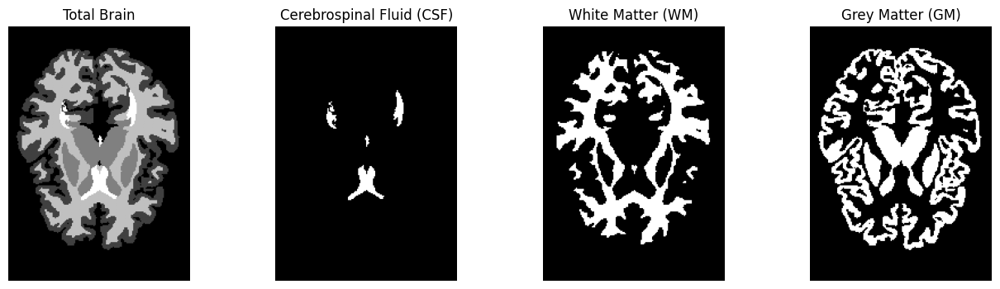

In [5]:
total_brain_mask = slice_90_1

# Create a mask for each tissue type based on the voxel values
gm_mask = (slice_90_1 == 1) | (slice_90_1 == 2) # Grey Matter (GM)
wm_mask = slice_90_1 == 3              # White Matter (WM)
csf_mask = slice_90_1 == 4             # Cerebrospinal Fluid (CSF)

all_mask = {"gm_mask" : gm_mask , "wm_mask" : wm_mask, "csf_mask" : csf_mask}

# Plotting the images in a single row
fig, axs = plt.subplots(1, 4, figsize=(16, 4))

# Total Brain
axs[0].imshow(total_brain_mask, cmap='gray', origin='lower')
axs[0].set_title('Total Brain')
axs[0].axis('off')

# CSF (Cerebrospinal Fluid)
axs[1].imshow(csf_mask, cmap='gray', origin='lower')
axs[1].set_title('Cerebrospinal Fluid (CSF)')
axs[1].axis('off')

# WM (White Matter)
axs[2].imshow(wm_mask, cmap='gray', origin='lower')
axs[2].set_title('White Matter (WM)')
axs[2].axis('off')

# GM (Grey Matter)
axs[3].imshow(gm_mask, cmap='gray', origin='lower')
axs[3].set_title('Grey Matter (GM)')
axs[3].axis('off')

plt.show()

#### SNR in arbitrary unit.

In [6]:
def calculate_snr(B0, TR, TE, T1, T2_star, BW, alpha):
    """
    Calculate the SNR for a given tissue and set of MRI parameters.
    
    Parameters:
    - B0: Magnetic field strength in Tesla (T)
    - TR: Repetition Time in milliseconds (ms)
    - T1: Longitudinal relaxation time of the tissue in milliseconds (ms)
    - alpha: Flip angle in radians
    - TE: Echo Time in milliseconds (ms)
    - T2_star: Effective transverse relaxation time in milliseconds (ms)
    - BW: Bandwidth (arbitrary units, affects noise level)
    
    Returns:
    - SNR: Signal-to-noise ratio in arbitrary units (au)
    """
    alpha_rad = np.radians(alpha)  # Convert alpha to radians

    numerator = B0 * 1e3 * np.sin(alpha_rad) * np.exp(-TE / T2_star) * (1 - np.exp(-TR / T1))
    denominator = np.sqrt(BW) * (1 - np.cos(alpha_rad) * np.exp(-TR / T1))
    
    # Compute SNR
    snr = numerator / denominator
    return snr


#### T1 Relaxation Time

In [7]:
def calculate_t1(B0, tissue_type):
    """
    Calculate the T1 relaxation time for a specific tissue at a given magnetic field strength (B0).
    
    Parameters:
    - B0: Magnetic field strength in Tesla (T)
    - tissue_type: The type of tissue ("WM", "GM", or "CSF")
    
    Returns:
    - T1: T1 relaxation time in seconds
    """
    # Gyromagnetic constant
    gamma = 42.577e6  # Gyromagnetic constant in Hz/T
    tissue_params = {
        "WM": {"alpha": 0.00071, "beta": 0.382, "delta": (2 * B0 + 18) * 0.001},
        "GM": {"alpha": 0.00116, "beta": 0.376, "delta": (5 * B0 + 54) * 0.001},
        "CSF": {"alpha": 4.32900, "beta": 0, "delta": 0.2}
    }
    params = tissue_params.get(tissue_type)
    if params is None:
        raise ValueError("Invalid tissue type. Please choose from 'WM', 'GM', or 'CSF'.")
    
    alpha = params["alpha"]
    beta = params["beta"]
    delta = params["delta"]
    T1 = alpha * (gamma * B0) ** beta + delta
    return T1 * 1000  # Convert to ms

# Create a DataFrame for T1 relaxation times across a range of B0 values
B0_values = [round(0.5 + 0.5 * i, 2) for i in range(17)]  # B0 from 0.5 T to 9.0 T in steps of 0.5
tissue_types = ["WM", "GM", "CSF"]

# Calculate T1 values and store in a DataFrame
data = []
for B0 in B0_values:
    row = {"B0": B0}
    for tissue in tissue_types:
        row[f"T1_{tissue}"] = calculate_t1(B0, tissue)
    data.append(row)

t1_df = pd.DataFrame(data)

# Display the resulting DataFrame
t1_df


,B0,T1_WM,T1_GM,T1_CSF
0,0.5,466.311190,716.950894,4529.0
1,1.0,602.912302,916.092729,4529.0
2,1.5,701.565738,1059.747254,4529.0
3,2.0,781.620504,1176.282461,4529.0
4,2.5,850.211006,1276.131963,4529.0
5,3.0,910.877302,1364.464161,4529.0
6,3.5,965.669827,1444.268786,4529.0
7,4.0,1015.897295,1517.452070,4529.0
8,4.5,1062.453024,1585.314038,4529.0
9,5.0,1105.977664,1648.786293,4529.0


#### T2* weighted value 

In [8]:
def calculate_t2_star(B0, tissue_type):
    """
    Calculate the T2* relaxation time for a specific tissue at a given magnetic field strength (B0).
    
    Parameters:
    - B0: Magnetic field strength in Tesla (T)
    - tissue_type: The type of tissue ("WM", "GM", or "CSF")
    
    Returns:
    - T2_star: T2* relaxation time in milliseconds
    """
    # Tissue-specific parameters for T2*
    tissue_params = {
        "WM": {"alpha": 0.090, "beta": 0.142, "delta": (1.5 * B0) * 0.001},
        "GM": {"alpha": 0.064, "beta": 0.132, "delta": (1.5 * B0) * 0.001},
        "CSF": {"alpha": 0.1, "beta": 0, "delta": 0.003}
    }
    params = tissue_params.get(tissue_type)
    if params is None:
        raise ValueError("Invalid tissue type. Please choose from 'WM', 'GM', or 'CSF'.")
    
    alpha = params["alpha"]
    beta = params["beta"]
    delta = params["delta"]
    T2_star = alpha * np.exp(-beta * B0) + delta
    return T2_star * 1000  # Convert to ms

# Create a DataFrame for T2* relaxation times across a range of B0 values
B0_values = [round(0.5 + 0.5 * i, 2) for i in range(17)]  # B0 from 0.5 T to 9.0 T in steps of 0.5
tissue_types = ["WM", "GM", "CSF"]

# Calculate T2* values and store in a DataFrame
data = []
for B0 in B0_values:
    row = {"B0": B0}
    for tissue in tissue_types:
        row[f"T2_{tissue}"] = calculate_t2_star(B0, tissue)
    data.append(row)

t2_star_df = pd.DataFrame(data)

# Display the resulting DataFrame
t2_star_df


,B0,T2_WM,T2_GM,T2_CSF
0,0.5,84.581570,60.662375,103.0
1,1.0,79.585913,57.585824,103.0
2,1.5,74.984052,54.753671,103.0
3,2.0,70.748998,52.150307,103.0
4,2.5,66.855610,49.761119,103.0
5,3.0,63.280471,47.572429,103.0
6,3.5,60.001769,45.571430,103.0
7,4.0,56.999186,43.746135,103.0
8,4.5,54.253798,42.085322,103.0
9,5.0,51.747978,40.578485,103.0


#### Function to calculate and plot T1 and T2* values across B0 values

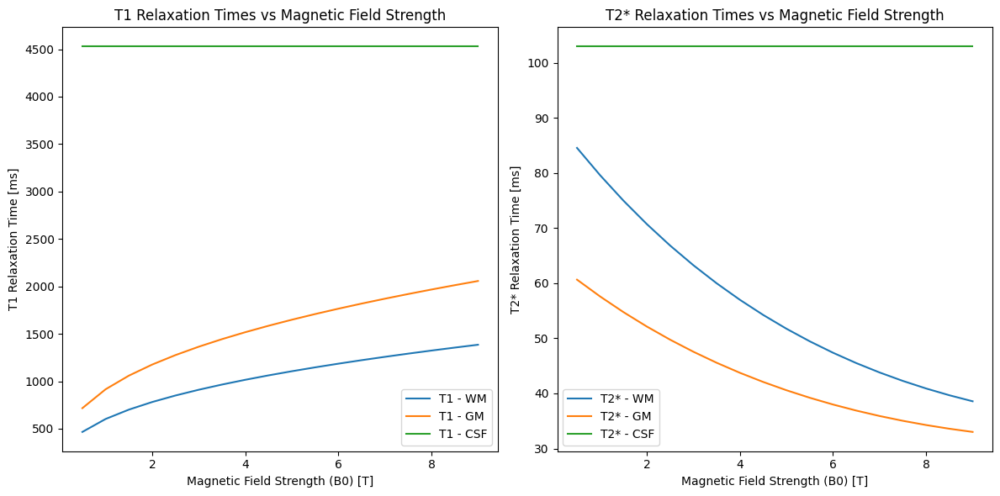

In [9]:
def plot_relaxation_times():
    # Magnetic field strengths (B0) range from 0.5 to 9 T
    B0_values = np.arange(0.5, 9.5, 0.5)
    tissues = ["WM", "GM", "CSF"]

    # Calculate T1 and T2* values for each tissue type across B0 values
    t1_values = {tissue: [calculate_t1(B0, tissue) for B0 in B0_values] for tissue in tissues}
    t2_star_values = {tissue: [calculate_t2_star(B0, tissue) for B0 in B0_values] for tissue in tissues}

    # Plotting T1 and T2* values
    plt.figure(figsize=(12, 6))

    # T1 Plot
    plt.subplot(1, 2, 1)
    for tissue in tissues:
        plt.plot(B0_values, t1_values[tissue], label=f'T1 - {tissue}')
    plt.xlabel('Magnetic Field Strength (B0) [T]')
    plt.ylabel('T1 Relaxation Time [ms]')
    plt.title('T1 Relaxation Times vs Magnetic Field Strength')
    plt.legend()

    # T2* Plot
    plt.subplot(1, 2, 2)
    for tissue in tissues:
        plt.plot(B0_values, t2_star_values[tissue], label=f'T2* - {tissue}')
    plt.xlabel('Magnetic Field Strength (B0) [T]')
    plt.ylabel('T2* Relaxation Time [ms]')
    plt.title('T2* Relaxation Times vs Magnetic Field Strength')
    plt.legend()

    plt.tight_layout()
    plt.show()
    return t1_values, t2_star_values
# Call the function to generate the plot
t1_values, t2_star_values = plot_relaxation_times()

#### Bandwidth Calculation

In [10]:
def calculate_bandwidth(TE, DeadTime=3e-3):
    """
    Calculate the bandwidth (BW) used in signal acquisition.

    Parameters:
    - TE: Echo Time in seconds
    - DeadTime: Dead time in seconds, default is 3e-3 (3 ms)

    Returns:
    - BW: Bandwidth in Hz
    """
    BW = 1 / (2 * TE - DeadTime)
    return BW


#### TE and TR implementation

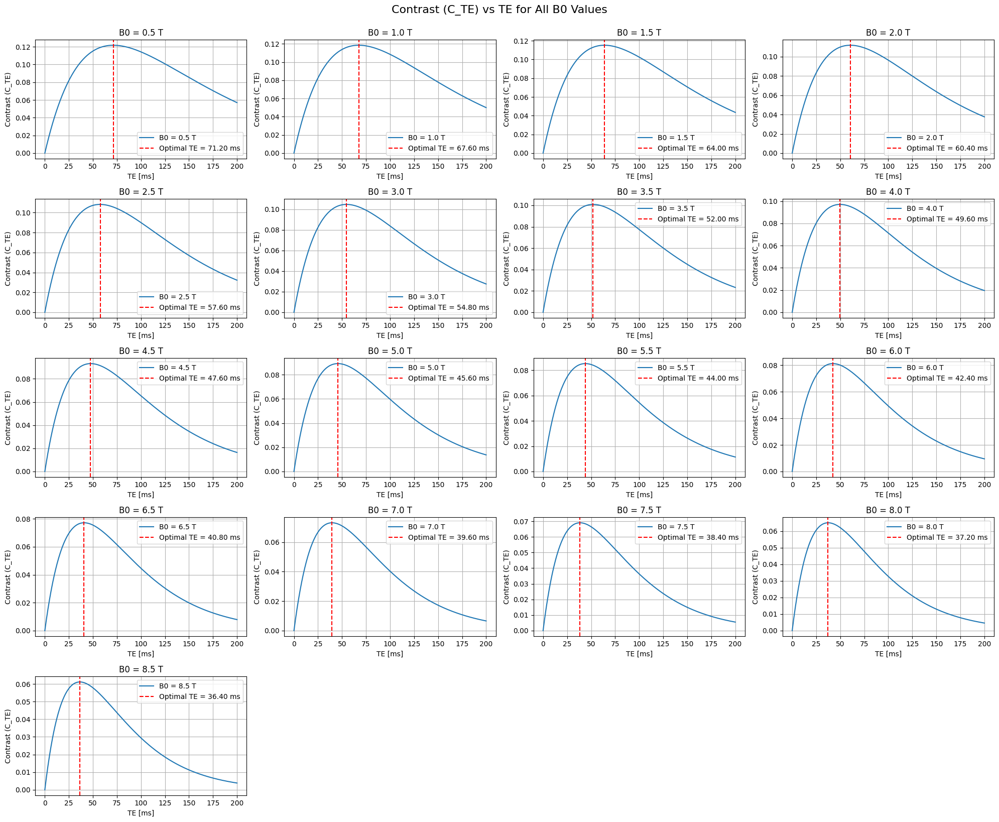

In [11]:
# Function to calculate T1-weighted TE and TR
def calculate_te_tr_t1(T2_star_WM):
    TE = T2_star_WM / 8  # T1-weighted TE
    TR = 2 * TE          # T1-weighted TR
    return TE, TR


# Function to calculate signal for a given tissue in T2*-weighted scan
def calculate_signal(TE, T2_star):
    return np.exp(-TE / T2_star)

# Function to calculate contrast between WM and GM for T2*-weighted scan
def calculate_contrast(TE, T2_star_WM, T2_star_GM):
    S_WM = calculate_signal(TE, T2_star_WM)
    S_GM = calculate_signal(TE, T2_star_GM)
    return abs(S_WM - S_GM)

# Function to find optimal TE for T2*-weighted scan
def find_optimal_te(T2_star_WM, T2_star_GM):
    TE_values = np.arange(0, 200.4, 0.4)  # TE values from 0 to 200 ms in increments of 0.4 ms
    contrast_values = [calculate_contrast(TE / 1000, T2_star_WM, T2_star_GM) for TE in TE_values]  # Convert ms to seconds
    optimal_TE_T2= TE_values[np.argmax(contrast_values)]
    optimal_TR_T2 = 2 * optimal_TE_T2
    return TE_values, contrast_values, optimal_TE_T2, optimal_TR_T2

# DataFrame to store the results
results = []

# Create a 5x4 grid for contrast vs TE plots
fig, axs = plt.subplots(5, 4, figsize=(20, 16))  # 5 rows, 4 columns


# Loop over each row (representing different B0 values) in the T2 DataFrame
for idx, (i, row) in enumerate(t2_star_df.iterrows()):
    T2_star_WM = row["T2_WM"] / 1000  # Convert ms to seconds
    T2_star_GM = row["T2_GM"] / 1000  # Convert ms to seconds

    TE_T1, TR_T1 = calculate_te_tr_t1(T2_star_WM * 1000)
    # Calculate optimal TE and contrast values
    TE_values, contrast_values, optimal_TE_T2, optimal_TR_T2 = find_optimal_te(T2_star_WM, T2_star_GM)

    # Store results
    results.append({
        "B0": row["B0"],
        "TE_T1": TE_T1,
        "TR_T1": TR_T1,
        "Optimal_TE_T2": optimal_TE_T2,
        "Optimal_TR_T2": optimal_TR_T2
    })

    # Plot the contrast vs TE in the corresponding subplot
    ax = axs[idx // 4, idx % 4]  # Determine the subplot
    ax.plot(TE_values, contrast_values, label=f"B0 = {row['B0']} T")
    ax.axvline(optimal_TE_T2, color="red", linestyle="--", label=f"Optimal TE = {optimal_TE_T2:.2f} ms")
    ax.set_title(f"B0 = {row['B0']} T")
    ax.set_xlabel("TE [ms]")
    ax.set_ylabel("Contrast (C_TE)")
    ax.legend()
    ax.grid(True)

# Hide unused subplots if fewer than 20
for idx in range(len(t2_star_df), 20):
    fig.delaxes(axs[idx // 4, idx % 4])

# Adjust layout and show the plot
plt.tight_layout()
plt.suptitle("Contrast (C_TE) vs TE for All B0 Values", fontsize=16, y=1.02)
plt.show()
# Convert results to DataFrame
results_df = pd.DataFrame(results)


In [12]:
combined_df = t2_star_df.merge(t1_df, on="B0").merge(results_df, on="B0")
combined_df


,B0,T2_WM,T2_GM,T2_CSF,T1_WM,T1_GM,T1_CSF,TE_T1,TR_T1,Optimal_TE_T2,Optimal_TR_T2
0,0.5,84.581570,60.662375,103.0,466.311190,716.950894,4529.0,10.572696,21.145393,71.2,142.4
1,1.0,79.585913,57.585824,103.0,602.912302,916.092729,4529.0,9.948239,19.896478,67.6,135.2
2,1.5,74.984052,54.753671,103.0,701.565738,1059.747254,4529.0,9.373007,18.746013,64.0,128.0
3,2.0,70.748998,52.150307,103.0,781.620504,1176.282461,4529.0,8.843625,17.687250,60.4,120.8
4,2.5,66.855610,49.761119,103.0,850.211006,1276.131963,4529.0,8.356951,16.713902,57.6,115.2
5,3.0,63.280471,47.572429,103.0,910.877302,1364.464161,4529.0,7.910059,15.820118,54.8,109.6
6,3.5,60.001769,45.571430,103.0,965.669827,1444.268786,4529.0,7.500221,15.000442,52.0,104.0
7,4.0,56.999186,43.746135,103.0,1015.897295,1517.452070,4529.0,7.124898,14.249796,49.6,99.2
8,4.5,54.253798,42.085322,103.0,1062.453024,1585.314038,4529.0,6.781725,13.563450,47.6,95.2
9,5.0,51.747978,40.578485,103.0,1105.977664,1648.786293,4529.0,6.468497,12.936994,45.6,91.2


#### Flip Angle

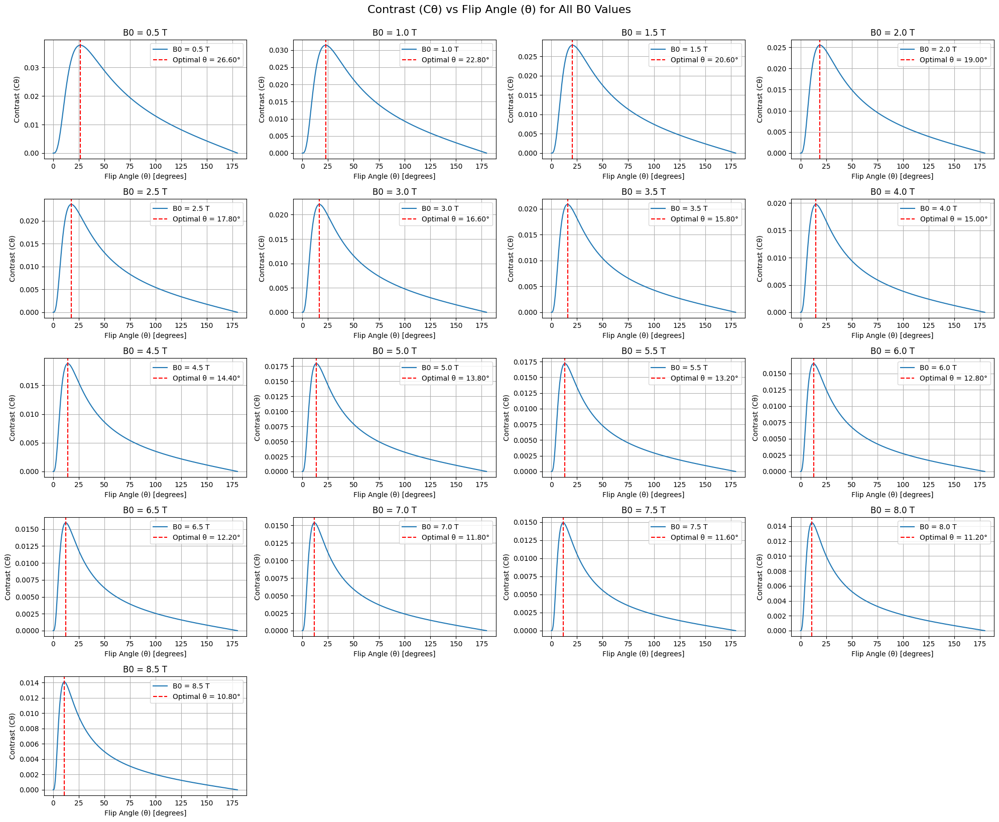


Updated Combined DataFrame:


,B0,T2_WM,T2_GM,T2_CSF,T1_WM,T1_GM,T1_CSF,TE_T1,TR_T1,Optimal_TE_T2,Optimal_TR_T2,Optimal_Flip_Angle
0,0.5,84.581570,60.662375,103.0,466.311190,716.950894,4529.0,10.572696,21.145393,71.2,142.4,26.6
1,1.0,79.585913,57.585824,103.0,602.912302,916.092729,4529.0,9.948239,19.896478,67.6,135.2,22.8
2,1.5,74.984052,54.753671,103.0,701.565738,1059.747254,4529.0,9.373007,18.746013,64.0,128.0,20.6
3,2.0,70.748998,52.150307,103.0,781.620504,1176.282461,4529.0,8.843625,17.687250,60.4,120.8,19.0
4,2.5,66.855610,49.761119,103.0,850.211006,1276.131963,4529.0,8.356951,16.713902,57.6,115.2,17.8
5,3.0,63.280471,47.572429,103.0,910.877302,1364.464161,4529.0,7.910059,15.820118,54.8,109.6,16.6
6,3.5,60.001769,45.571430,103.0,965.669827,1444.268786,4529.0,7.500221,15.000442,52.0,104.0,15.8
7,4.0,56.999186,43.746135,103.0,1015.897295,1517.452070,4529.0,7.124898,14.249796,49.6,99.2,15.0
8,4.5,54.253798,42.085322,103.0,1062.453024,1585.314038,4529.0,6.781725,13.563450,47.6,95.2,14.4
9,5.0,51.747978,40.578485,103.0,1105.977664,1648.786293,4529.0,6.468497,12.936994,45.6,91.2,13.8


In [13]:
def calculate_signal_t1(theta, TR, T1):
    theta_rad = np.radians(theta)  # Convert angle to radians
    numerator = (1 - np.exp(-TR / T1)) * np.sin(theta_rad)
    denominator = 1 - np.cos(theta_rad) * np.exp(-TR / T1)
    return numerator / denominator

# Function to calculate contrast Cθ for T1-weighted scan
def calculate_contrast_theta(theta, TR, T1_WM, T1_GM):
    S_WM = calculate_signal_t1(theta, TR, T1_WM)
    S_GM = calculate_signal_t1(theta, TR, T1_GM)
    return abs(S_WM - S_GM)

# Function to find optimal flip angle for T1-weighted scan
def find_optimal_flip_angle_t1(TR, T1_WM, T1_GM):
    theta_values = np.arange(0, 180, 0.2)  # Flip angles from 0 to 180 degrees
    contrast_values = [calculate_contrast_theta(theta, TR, T1_WM, T1_GM) for theta in theta_values]
    optimal_theta = theta_values[np.argmax(contrast_values)]
    return optimal_theta, theta_values, contrast_values

# Prepare for plotting in a 5x4 grid
fig, axs = plt.subplots(5, 4, figsize=(20, 16))  # Create a 5x4 grid of subplots
optimal_angles = []  # To store optimal flip angles

# Loop over each row in combined_df
for idx, row in combined_df.iterrows():
    TR_T1 = row["TR_T1"]
    T1_WM = row["T1_WM"]
    T1_GM = row["T1_GM"]

    # Find the optimal flip angle and contrast
    optimal_flip_angle, theta_values, contrast_values = find_optimal_flip_angle_t1(TR_T1, T1_WM, T1_GM)
    optimal_angles.append(optimal_flip_angle)

    # Plot in the corresponding grid cell
    ax = axs[idx // 4, idx % 4]  # Determine subplot position
    ax.plot(theta_values, contrast_values, label=f"B0 = {row['B0']} T")
    ax.axvline(optimal_flip_angle, color="red", linestyle="--", label=f"Optimal θ = {optimal_flip_angle:.2f}°")
    ax.set_title(f"B0 = {row['B0']} T")
    ax.set_xlabel("Flip Angle (θ) [degrees]")
    ax.set_ylabel("Contrast (Cθ)")
    ax.legend()
    ax.grid(True)

# Hide unused subplots if fewer than 20
for idx in range(len(combined_df), 20):
    fig.delaxes(axs[idx // 4, idx % 4])

# Finalize and show the plot
plt.tight_layout()
plt.suptitle("Contrast (Cθ) vs Flip Angle (θ) for All B0 Values", fontsize=16, y=1.02)
plt.show()

# Add the Optimal Flip Angle column to the DataFrame
combined_df["Optimal_Flip_Angle"] = optimal_angles

# Display the updated DataFrame
print("\nUpdated Combined DataFrame:")
combined_df



#### Ernst Angle

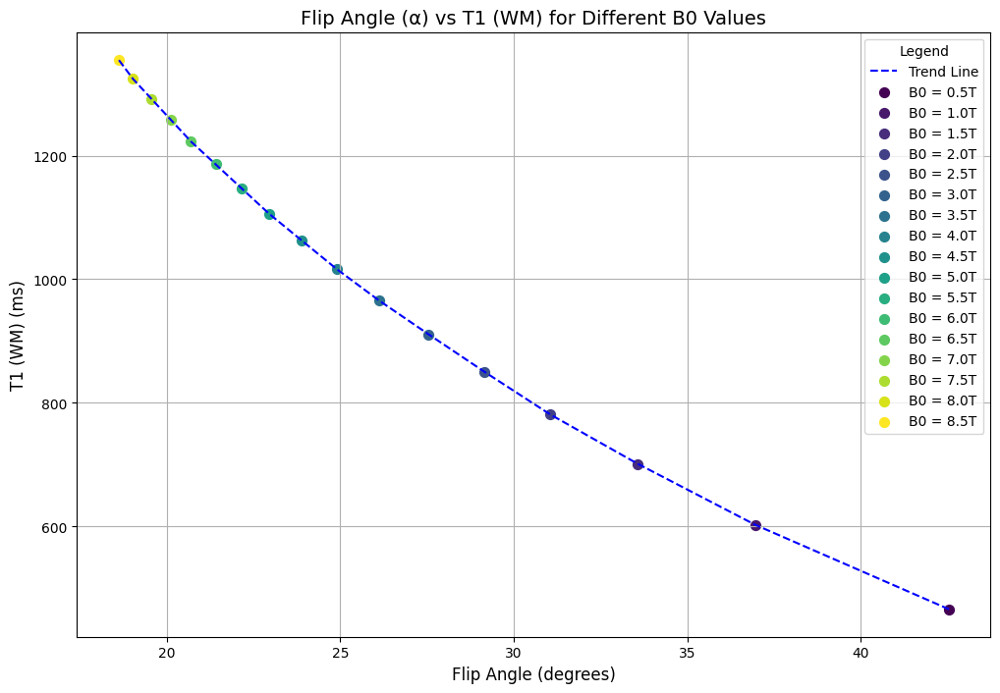

In [14]:

def calculate_ernst_angle(TR, T1):
    """
    Calculate the Ernst angle for T2*-weighted imaging.

    Parameters:
    - TR: Repetition time (in ms)
    - T1: T1 relaxation time (in ms)

    Returns:
    - Ernst angle (in degrees)
    """
    ernst_angle_rad = np.arccos(np.exp(-TR / T1))
    ernst_angle_deg = np.degrees(ernst_angle_rad)
    return ernst_angle_deg


# Add Ernst angle for WM to the DataFrame
combined_df["Ernst_Angle_WM"] = combined_df.apply(
    lambda row: calculate_ernst_angle(row["Optimal_TR_T2"], row["T1_WM"]), axis=1
)

flip_angles = list(combined_df["Ernst_Angle_WM"])
t1_wm = list(combined_df["T1_WM"])
b0_values = list(combined_df["B0"])

plt.figure(figsize=(12, 8))

# Plot the trend line
plt.plot(flip_angles, t1_wm,linestyle='--', color='blue', label="Trend Line")

# Use a colormap to assign unique colors to each B0 value
colors = cm.viridis(np.linspace(0, 1, len(b0_values)))

# Plot points for B0 values with unique colors
for angle, t1, b0, color in zip(flip_angles, t1_wm, b0_values, colors):
    plt.scatter(angle, t1, color=color, label=f'B0 = {b0}T', s=50)  # Mark each point with a unique color

# Add labels and title
plt.xlabel('Flip Angle (degrees)', fontsize=12)
plt.ylabel('T1 (WM) (ms)', fontsize=12)
plt.title('Flip Angle (α) vs T1 (WM) for Different B0 Values', fontsize=14)
plt.legend(title='Legend', loc='upper right', fontsize=10)
plt.grid(True)

# Show plot
plt.show()


### SNR Map Generation

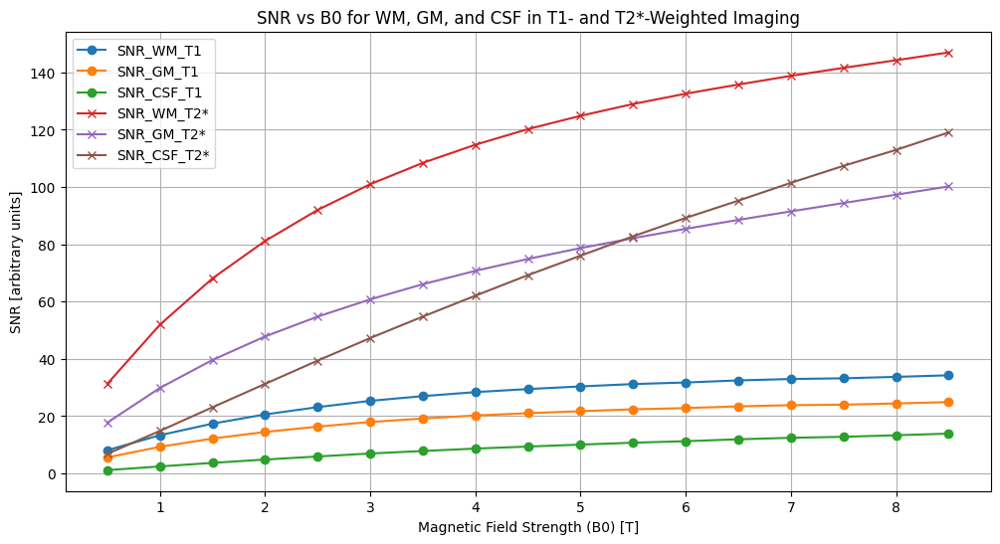

,B0,SNR_WM_T1,SNR_GM_T1,SNR_CSF_T1,SNR_WM_T2*,SNR_GM_T2*,SNR_CSF_T2*
0,0.5,8.109949,5.584972,1.152347,31.314100,17.757599,6.843321
1,1.0,13.353700,9.296455,2.439533,51.959681,29.859367,14.862781
2,1.5,17.388077,12.177226,3.683301,68.127758,39.630926,23.105405
3,2.0,20.600580,14.491261,4.852757,81.175432,47.832144,31.268905
4,2.5,23.153098,16.337594,5.916581,92.020052,54.763128,39.405972
5,3.0,25.345396,17.966706,6.960813,100.996309,60.777078,47.277647
6,3.5,26.990243,19.172165,7.835058,108.449829,66.075335,54.776960
7,4.0,28.399104,20.232547,8.674337,114.781852,70.742488,62.073871
8,4.5,29.462075,21.025394,9.385016,120.240191,74.891846,69.249337
9,5.0,30.382546,21.732869,10.067115,124.880007,78.691138,76.030952


In [15]:
snr_results = {"B0": [], "SNR_WM_T1": [], "SNR_GM_T1": [], "SNR_CSF_T1": [],
               "SNR_WM_T2*": [], "SNR_GM_T2*": [], "SNR_CSF_T2*": []}

for _, row in combined_df.iterrows():
    # Retrieve values from combined_df
    B0 = row["B0"]
    T1_WM, T1_GM, T1_CSF = row["T1_WM"], row["T1_GM"], row["T1_CSF"]
    T2_star_WM, T2_star_GM, T2_star_CSF = row["T2_WM"], row["T2_GM"], row["T2_CSF"]
    TR_T1, TE_T1 = row["TR_T1"], row["TE_T1"]
    Optimal_TR_T2, Optimal_TE_T2 = row["Optimal_TR_T2"], row["Optimal_TE_T2"]
    Optimal_Flip_Angle = row["Optimal_Flip_Angle"]
    Ernst_Angle_WM = row["Ernst_Angle_WM"]
    
    # Calculate bandwidth based on TE_T1 (or another TE if needed)
    BW_T1 = calculate_bandwidth(TE_T1 / 1000)  # Convert TE to seconds for BW calculation
    BW_T2 = calculate_bandwidth(Optimal_TE_T2 / 1000)  # Convert TE to seconds for BW calculation
    
    # Calculate SNR for T1-weighted imaging
    snr_wm_t1 = calculate_snr(B0, TR_T1 / 1000, TE_T1 / 1000, T1_WM / 1000, T2_star_WM / 1000, BW_T1, Optimal_Flip_Angle)
    snr_gm_t1 = calculate_snr(B0, TR_T1 / 1000, TE_T1 / 1000, T1_GM / 1000, T2_star_GM / 1000, BW_T1, Optimal_Flip_Angle)
    snr_csf_t1 = calculate_snr(B0, TR_T1 / 1000, TE_T1 / 1000, T1_CSF / 1000, T2_star_CSF / 1000, BW_T1, Optimal_Flip_Angle)
    
    # Calculate SNR for T2*-weighted imaging
    snr_wm_t2_star = calculate_snr(B0, Optimal_TR_T2 / 1000, Optimal_TE_T2 / 1000, T1_WM / 1000, T2_star_WM / 1000, BW_T2 , Ernst_Angle_WM)
    snr_gm_t2_star = calculate_snr(B0, Optimal_TR_T2 / 1000, Optimal_TE_T2 / 1000, T1_GM / 1000, T2_star_GM / 1000, BW_T2 , Ernst_Angle_WM)
    snr_csf_t2_star = calculate_snr(B0, Optimal_TR_T2 / 1000, Optimal_TE_T2 / 1000, T1_CSF / 1000, T2_star_CSF / 1000, BW_T2, Ernst_Angle_WM)
    
    # Append results to snr_results dictionary
    snr_results["B0"].append(B0)
    snr_results["SNR_WM_T1"].append(snr_wm_t1)
    snr_results["SNR_GM_T1"].append(snr_gm_t1)
    snr_results["SNR_CSF_T1"].append(snr_csf_t1)
    snr_results["SNR_WM_T2*"].append(snr_wm_t2_star)
    snr_results["SNR_GM_T2*"].append(snr_gm_t2_star)
    snr_results["SNR_CSF_T2*"].append(snr_csf_t2_star)

# Convert results to a DataFrame for analysis
snr_df = pd.DataFrame(snr_results)

# Plotting SNR vs B0 for WM, GM, CSF in both T1-weighted and T2*-weighted imaging
plt.figure(figsize=(12, 6))
plt.plot(snr_df["B0"], snr_df["SNR_WM_T1"], label="SNR_WM_T1", marker='o')
plt.plot(snr_df["B0"], snr_df["SNR_GM_T1"], label="SNR_GM_T1", marker='o')
plt.plot(snr_df["B0"], snr_df["SNR_CSF_T1"], label="SNR_CSF_T1", marker='o')
plt.plot(snr_df["B0"], snr_df["SNR_WM_T2*"], label="SNR_WM_T2*", marker='x')
plt.plot(snr_df["B0"], snr_df["SNR_GM_T2*"], label="SNR_GM_T2*", marker='x')
plt.plot(snr_df["B0"], snr_df["SNR_CSF_T2*"], label="SNR_CSF_T2*", marker='x')
plt.xlabel("Magnetic Field Strength (B0) [T]")
plt.ylabel("SNR [arbitrary units]")
plt.title("SNR vs B0 for WM, GM, and CSF in T1- and T2*-Weighted Imaging")
plt.legend()
plt.grid(True)
plt.show()


snr_df

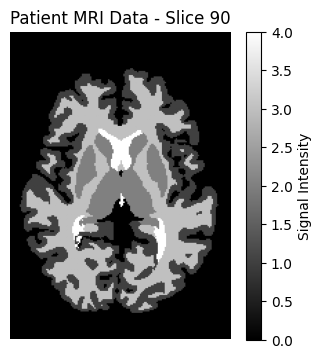

In [16]:
def plot_mri_slice(data, slice_idx, title="MRI Slice"):
    slice_data = data[:, slice_idx, :]  # Extract the slice at the specified index
    plt.figure(figsize=(4,4))
    plt.imshow(slice_data.T, cmap="gray", origin="lower")  # Transpose for correct orientation
    plt.title(f"{title} - Slice {slice_idx}")
    plt.colorbar(label="Signal Intensity")
    plt.axis("off")
    plt.show()

mri_data = load_patient_data(patient1_file_path)

# Plot slice 90 as an example
slice_idx = 90  # Specify the slice index you want to visualize
plot_mri_slice(mri_data, slice_idx, title="Patient MRI Data")


### Plotting T1, T2 star SNR valued plots for Patient1 and Patient2

### Patient - 1

#### T1 weighted SNR plots

Processing Patient 1...
Generating SNR maps for Patient 1 using precomputed SNR values...
Plotting SNR maps for Patient 1...


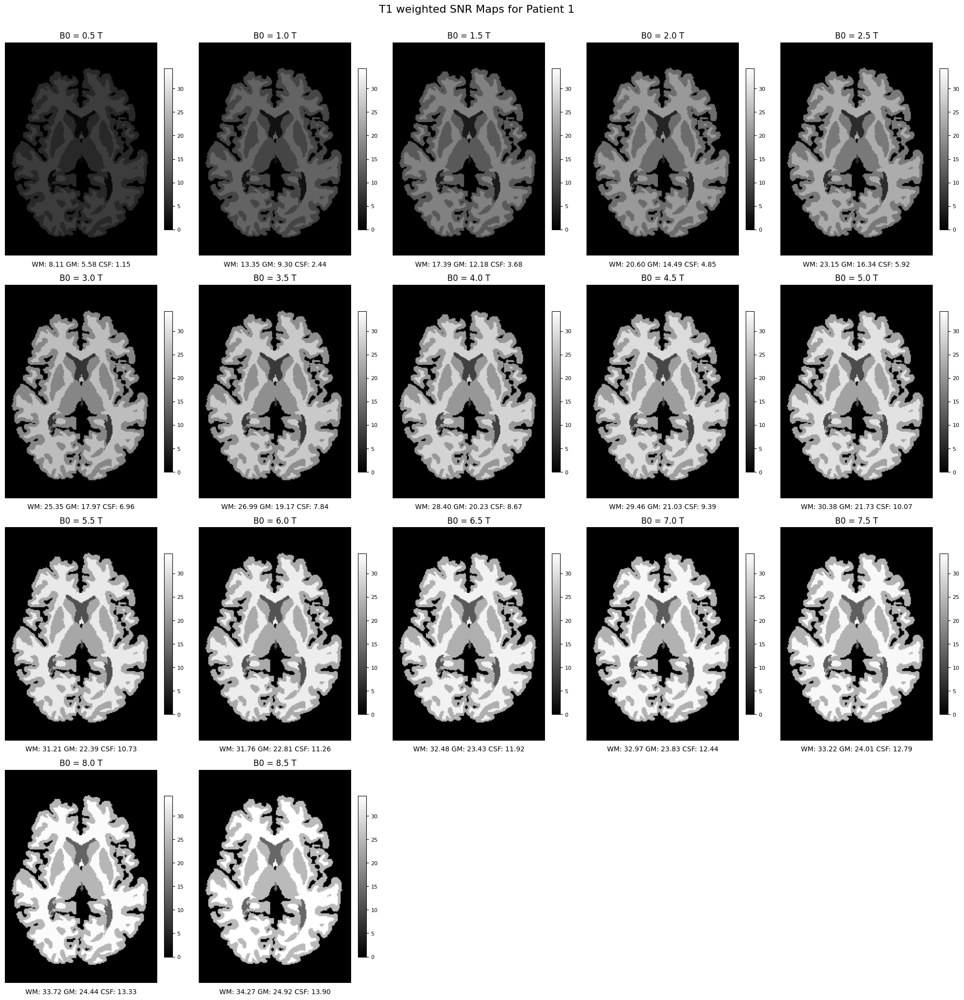

In [17]:
def generate_snr_maps_from_precomputed_t1(snr_df, gm_mask, wm_mask, csf_mask):
    snr_maps_csf = []
    snr_maps_wm = []
    snr_maps_gm = []

    for i, row in snr_df.iterrows():
        # Retrieve SNR values for the current B0 from snr_df
        snr_csf = snr_df.loc[i, "SNR_CSF_T1"] * csf_mask 
        snr_wm = snr_df.loc[i, "SNR_WM_T1"] * wm_mask 
        snr_gm = snr_df.loc[i, "SNR_GM_T1"] * gm_mask 

        snr_maps_csf.append(snr_csf)
        snr_maps_wm.append(snr_wm)
        snr_maps_gm.append(snr_gm)
    
    return snr_maps_csf, snr_maps_wm, snr_maps_gm


def plot_combined_snr_maps_4x5_t1(snr_maps_csf, snr_maps_wm, snr_maps_gm, snr_df, title):
    # Calculate global min and max for scaling
    all_snr_values = (
        np.concatenate([np.nan_to_num(snr) for snr in snr_maps_csf]) +
        np.concatenate([np.nan_to_num(snr) for snr in snr_maps_wm]) +
        np.concatenate([np.nan_to_num(snr) for snr in snr_maps_gm])
    )
    vmin, vmax = all_snr_values.min(), all_snr_values.max()

    fig, axs = plt.subplots(4, 5, figsize=(20, 20))

    for i, B0 in enumerate(snr_df["B0"].values):
        # Combine SNR maps
        combined_map = np.nan_to_num(snr_maps_csf[i]) + np.nan_to_num(snr_maps_wm[i]) + np.nan_to_num(snr_maps_gm[i])
        
        # Retrieve SNR values directly for this B0
        snr_csf = snr_df.loc[i, ["SNR_CSF_T1"]].values
        snr_wm = snr_df.loc[i, ["SNR_WM_T1"]].values
        snr_gm = snr_df.loc[i, ["SNR_GM_T1"]].values

        ax = axs[i // 5, i % 5]
        im = ax.imshow(combined_map.T, cmap="gray", origin="lower", vmin=vmin, vmax=vmax)
        ax.set_title(f"B0 = {B0} T")
        ax.axis("off")
        cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.ax.tick_params(labelsize=8)
        ax.text(
            0.5, -0.025,
            f"WM: {snr_wm[0]:.2f} "
            f"GM: {snr_gm[0]:.2f} "
            f"CSF: {snr_csf[0]:.2f}",
            transform=ax.transAxes, ha="center", va="top", fontsize=10, color="black"
        )

    for j in range(len(snr_df["B0"].values), 20):
        fig.delaxes(axs[j // 5, j % 5])
    
    plt.tight_layout()
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.show()


def process_patient_data_t1(mri_data, snr_df, patient_name):
    slice_idx = 90  # Specify the slice index you want to visualize
    slice_data = mri_data[:, slice_idx, :]
    gm_mask = (slice_data == 1) | (slice_data == 2)
    wm_mask = slice_data == 3
    csf_mask = slice_data == 4

    print(f"Generating SNR maps for {patient_name} using precomputed SNR values...")
    snr_maps_csf, snr_maps_wm, snr_maps_gm = generate_snr_maps_from_precomputed_t1(
        snr_df, gm_mask, wm_mask, csf_mask
    )

    print(f"Plotting SNR maps for {patient_name}...")
    plot_combined_snr_maps_4x5_t1(snr_maps_csf, snr_maps_wm, snr_maps_gm, snr_df, f"T1 weighted SNR Maps for {patient_name} ")


# Load MRI data and SNR dataframe
patient1_file_path = 'Patient1.nii.gz'
patient2_file_path = 'Patient2.nii.gz'
mri_data_1 = load_patient_data(patient1_file_path)
mri_data_2 = load_patient_data(patient2_file_path)

# Process Patient 1
print("Processing Patient 1...")
process_patient_data_t1(mri_data_1, snr_df, "Patient 1")

# Save the DataFrame to a CSV
combined_df.to_csv("combined_df_snr.csv", index=False)


#### T2* weighted SNR plots

Processing Patient 1...
Generating SNR maps for Patient 1 using precomputed SNR values...
Plotting SNR maps for Patient 1...


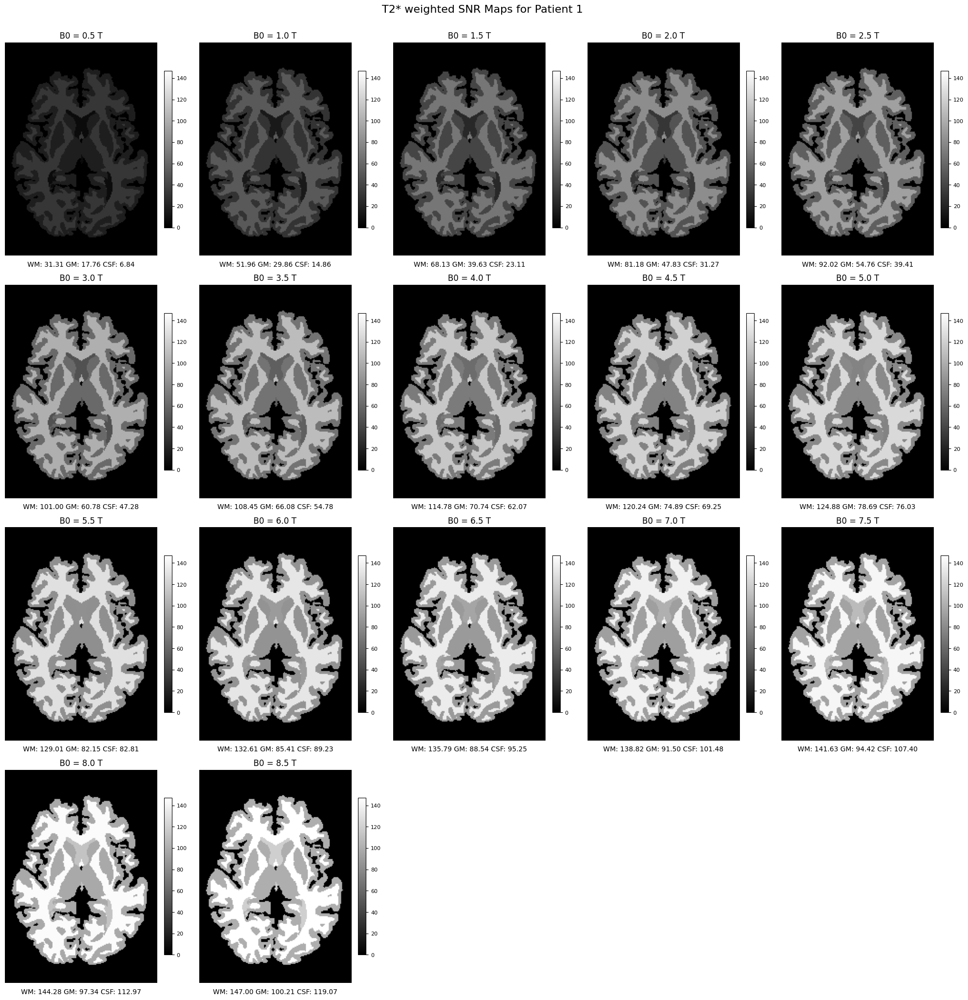

In [18]:
def generate_snr_maps_from_precomputed_t2(snr_df, gm_mask, wm_mask, csf_mask):
    snr_maps_csf = []
    snr_maps_wm = []
    snr_maps_gm = []

    for i, row in snr_df.iterrows():
        # Retrieve SNR values for the current B0 from snr_df
        snr_csf = snr_df.loc[i, "SNR_CSF_T2*"] * csf_mask 
        snr_wm = snr_df.loc[i, "SNR_WM_T2*"] * wm_mask 
        snr_gm = snr_df.loc[i, "SNR_GM_T2*"] * gm_mask 

        snr_maps_csf.append(snr_csf)
        snr_maps_wm.append(snr_wm)
        snr_maps_gm.append(snr_gm)
    
    return snr_maps_csf, snr_maps_wm, snr_maps_gm


def plot_combined_snr_maps_4x5_t2(snr_maps_csf, snr_maps_wm, snr_maps_gm, snr_df, title):
    # Calculate global min and max for scaling
    all_snr_values = (
        np.concatenate([np.nan_to_num(snr) for snr in snr_maps_csf]) +
        np.concatenate([np.nan_to_num(snr) for snr in snr_maps_wm]) +
        np.concatenate([np.nan_to_num(snr) for snr in snr_maps_gm])
    )
    vmin, vmax = all_snr_values.min(), all_snr_values.max()

    fig, axs = plt.subplots(4, 5, figsize=(20, 20))

    for i, B0 in enumerate(snr_df["B0"].values):
        # Combine SNR maps
        combined_map = np.nan_to_num(snr_maps_csf[i]) + np.nan_to_num(snr_maps_wm[i]) + np.nan_to_num(snr_maps_gm[i])
        
        # Retrieve SNR values directly for this B0
        snr_csf = snr_df.loc[i, ["SNR_CSF_T2*"]].values
        snr_wm = snr_df.loc[i, ["SNR_WM_T2*"]].values
        snr_gm = snr_df.loc[i, ["SNR_GM_T2*"]].values

        ax = axs[i // 5, i % 5]
        im = ax.imshow(combined_map.T, cmap="gray", origin="lower", vmin=vmin, vmax=vmax)
        ax.set_title(f"B0 = {B0} T")
        ax.axis("off")
        cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.ax.tick_params(labelsize=8)
        ax.text(
            0.5, -0.025,
            f"WM: {snr_wm[0]:.2f} "
            f"GM: {snr_gm[0]:.2f} "
            f"CSF: {snr_csf[0]:.2f}",
            transform=ax.transAxes, ha="center", va="top", fontsize=10, color="black"
        )

    for j in range(len(snr_df["B0"].values), 20):
        fig.delaxes(axs[j // 5, j % 5])
    
    plt.tight_layout()
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.show()


def process_patient_data_t2(mri_data, snr_df, patient_name):
    slice_idx = 90  # Specify the slice index you want to visualize
    slice_data = mri_data[:, slice_idx, :]
    gm_mask = (slice_data == 1) | (slice_data == 2)
    wm_mask = slice_data == 3
    csf_mask = slice_data == 4

    print(f"Generating SNR maps for {patient_name} using precomputed SNR values...")
    snr_maps_csf, snr_maps_wm, snr_maps_gm = generate_snr_maps_from_precomputed_t2(
        snr_df, gm_mask, wm_mask, csf_mask
    )

    print(f"Plotting SNR maps for {patient_name}...")
    plot_combined_snr_maps_4x5_t2(snr_maps_csf, snr_maps_wm, snr_maps_gm, snr_df, f"T2* weighted SNR Maps for {patient_name}")


# Load MRI data and SNR dataframe
patient1_file_path = 'Patient1.nii.gz'
patient2_file_path = 'Patient2.nii.gz'
mri_data_1 = load_patient_data(patient1_file_path)
mri_data_2 = load_patient_data(patient2_file_path)

# Process Patient 1
print("Processing Patient 1...")
process_patient_data_t2(mri_data_1, snr_df, "Patient 1")


# Save the DataFrame to a CSV
combined_df.to_csv("combined_df_snr.csv", index=False)


### Patient-2

#### T1 weighted SNR plots

Processing Patient 2...
Generating SNR maps for Patient 2 using precomputed SNR values...
Plotting SNR maps for Patient 2...


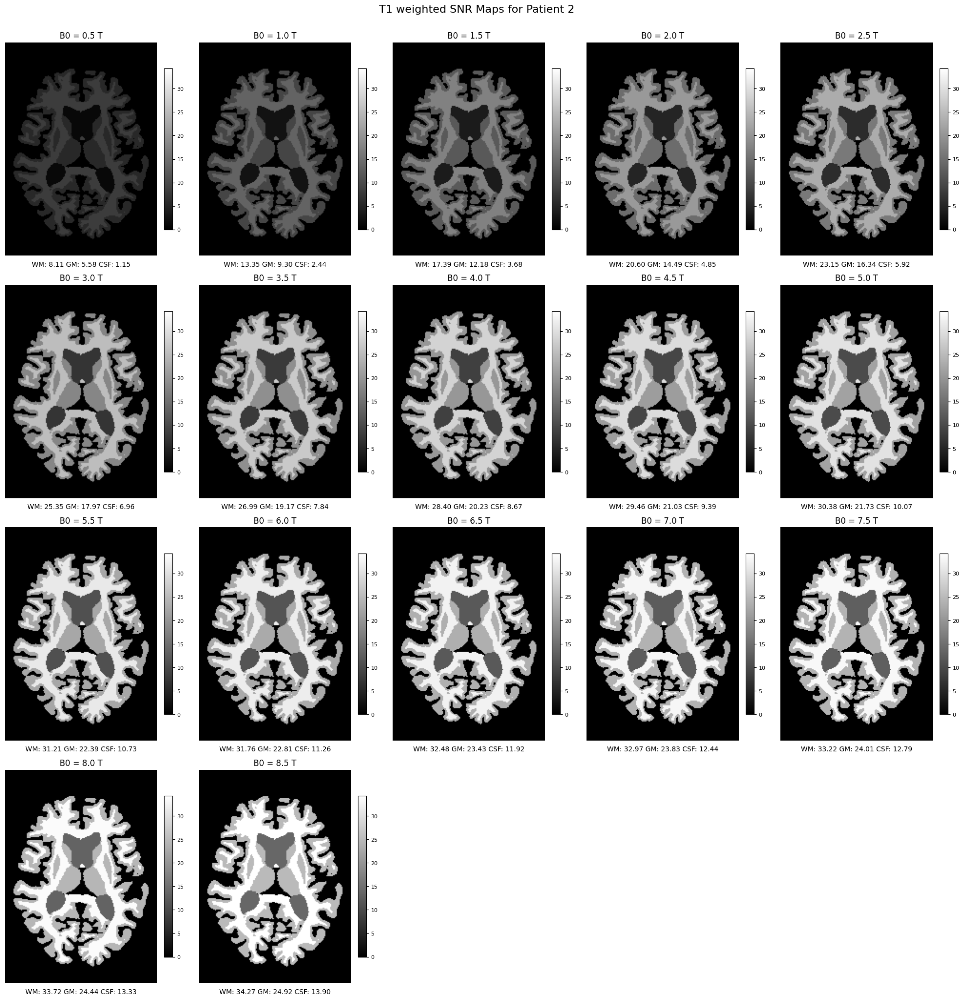

In [19]:
# Process Patient 2
print("Processing Patient 2...")
process_patient_data_t1(mri_data_2, snr_df, "Patient 2")


#### T2* weighted SNR plots

Processing Patient 2...
Generating SNR maps for Patient 2 using precomputed SNR values...
Plotting SNR maps for Patient 2...


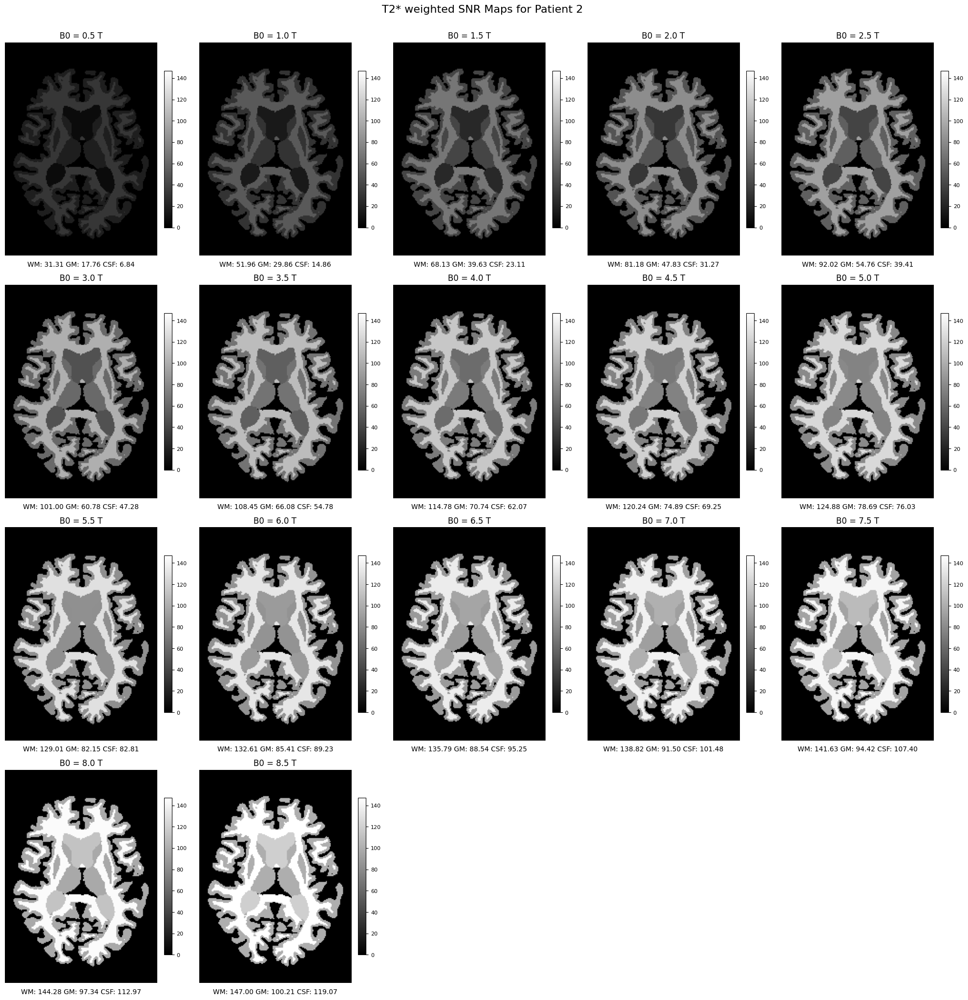

In [20]:
# Process Patient 2
print("Processing Patient 2...")
process_patient_data_t2(mri_data_2, snr_df, "Patient 2")


### Noise Addition

In [21]:
np.random.seed(123)
def add_noise(signal, sigma_n):
    noise = np.random.normal(-sigma_n, sigma_n, signal.shape)
    noisy_signal = np.where(signal != 0, signal + noise, signal)
    return noisy_signal

In [22]:
snr_df.columns

Index(['B0', 'SNR_WM_T1', 'SNR_GM_T1', 'SNR_CSF_T1', 'SNR_WM_T2*',
       'SNR_GM_T2*', 'SNR_CSF_T2*'],
      dtype='object')

In [23]:
noise_si_data = {}

for index, row in snr_df.iterrows():
    B0 = row['B0']
    noise = 40 * (1 + np.log(B0))  # Calculate noise based on B0
    
    # Calculate signal intensity for all tissues
    si_values = {}
    for tissue in ['SNR_WM_T1', 'SNR_GM_T1', 'SNR_CSF_T1', 'SNR_WM_T2*', 'SNR_GM_T2*', 'SNR_CSF_T2*']:
        snr_value = row[tissue]
        si_values[tissue] = round(snr_value * noise, 4)  # Calculate signal intensity for each tissue
    
    # Store the data in a structured format
    noise_si_data[B0] = {
        'SNR_T1': {tissue: row[tissue] for tissue in ['SNR_WM_T1', 'SNR_GM_T1', 'SNR_CSF_T1']},  # Store original SNR_T1 values
        'SNR_T2*': {tissue: row[tissue] for tissue in ['SNR_WM_T2*', 'SNR_GM_T2*', 'SNR_CSF_T2*']},  # Store original SNR_T2* values
        'Noise': round(noise, 4),  # Store calculated noise
        'SI_T1': {tissue: si_values[tissue] for tissue in ['SNR_WM_T1', 'SNR_GM_T1', 'SNR_CSF_T1']},  # Store SI_T1 values
        'SI_T2*': {tissue: si_values[tissue] for tissue in ['SNR_WM_T2*', 'SNR_GM_T2*', 'SNR_CSF_T2*']},  # Store SI_T2* values
    }

# Convert the structured dictionary to a DataFrame
noise_si_df = pd.DataFrame.from_dict(noise_si_data, orient='index')
noise_si_df


,SNR_T1,SNR_T2*,Noise,SI_T1,SI_T2*
0.5,"{'SNR_WM_T1': 8.109949421627968, 'SNR_GM_T1': ...","{'SNR_WM_T2*': 31.31410016374197, 'SNR_GM_T2*'...",12.2741,"{'SNR_WM_T1': 99.5424, 'SNR_GM_T1': 68.5506, '...","{'SNR_WM_T2*': 384.3528, 'SNR_GM_T2*': 217.958..."
1.0,"{'SNR_WM_T1': 13.35369995008034, 'SNR_GM_T1': ...","{'SNR_WM_T2*': 51.95968108335951, 'SNR_GM_T2*'...",40.0000,"{'SNR_WM_T1': 534.148, 'SNR_GM_T1': 371.8582, ...","{'SNR_WM_T2*': 2078.3872, 'SNR_GM_T2*': 1194.3..."
1.5,"{'SNR_WM_T1': 17.38807695795227, 'SNR_GM_T1': ...","{'SNR_WM_T2*': 68.12775791948988, 'SNR_GM_T2*'...",56.2186,"{'SNR_WM_T1': 977.5334, 'SNR_GM_T1': 684.5867,...","{'SNR_WM_T2*': 3830.0475, 'SNR_GM_T2*': 2227.9..."
2.0,"{'SNR_WM_T1': 20.600580028898595, 'SNR_GM_T1':...","{'SNR_WM_T2*': 81.1754320839852, 'SNR_GM_T2*':...",67.7259,"{'SNR_WM_T1': 1395.1926, 'SNR_GM_T1': 981.4335...","{'SNR_WM_T2*': 5497.6782, 'SNR_GM_T2*': 3239.4..."
2.5,"{'SNR_WM_T1': 23.15309814001288, 'SNR_GM_T1': ...","{'SNR_WM_T2*': 92.02005206530447, 'SNR_GM_T2*'...",76.6516,"{'SNR_WM_T1': 1774.7227, 'SNR_GM_T1': 1252.303...","{'SNR_WM_T2*': 7053.4869, 'SNR_GM_T2*': 4197.6..."
3.0,"{'SNR_WM_T1': 25.34539594239857, 'SNR_GM_T1': ...","{'SNR_WM_T2*': 100.99630949680692, 'SNR_GM_T2*...",83.9445,"{'SNR_WM_T1': 2127.6064, 'SNR_GM_T1': 1508.206...","{'SNR_WM_T2*': 8478.0838, 'SNR_GM_T2*': 5101.9..."
3.5,"{'SNR_WM_T1': 26.990243382022957, 'SNR_GM_T1':...","{'SNR_WM_T2*': 108.44982901740836, 'SNR_GM_T2*...",90.1105,"{'SNR_WM_T1': 2432.1048, 'SNR_GM_T1': 1727.613...","{'SNR_WM_T2*': 9772.4704, 'SNR_GM_T2*': 5954.0..."
4.0,"{'SNR_WM_T1': 28.399103907338706, 'SNR_GM_T1':...","{'SNR_WM_T2*': 114.78185208006687, 'SNR_GM_T2*...",95.4518,"{'SNR_WM_T1': 2710.7449, 'SNR_GM_T1': 1931.232...","{'SNR_WM_T2*': 10956.1315, 'SNR_GM_T2*': 6752...."
4.5,"{'SNR_WM_T1': 29.46207526832584, 'SNR_GM_T1': ...","{'SNR_WM_T2*': 120.24019059764974, 'SNR_GM_T2*...",100.1631,"{'SNR_WM_T1': 2951.0127, 'SNR_GM_T1': 2105.968...","{'SNR_WM_T2*': 12043.6297, 'SNR_GM_T2*': 7501...."
5.0,"{'SNR_WM_T1': 30.38254590490585, 'SNR_GM_T1': ...","{'SNR_WM_T2*': 124.88000677596162, 'SNR_GM_T2*...",104.3775,"{'SNR_WM_T1': 3171.2547, 'SNR_GM_T1': 2268.422...","{'SNR_WM_T2*': 13034.665, 'SNR_GM_T2*': 8213.5..."


### Patient - 1

#### T1 weighted Noisy plots

Processing noisy MRI images for Patient - 1 for T1 weights...


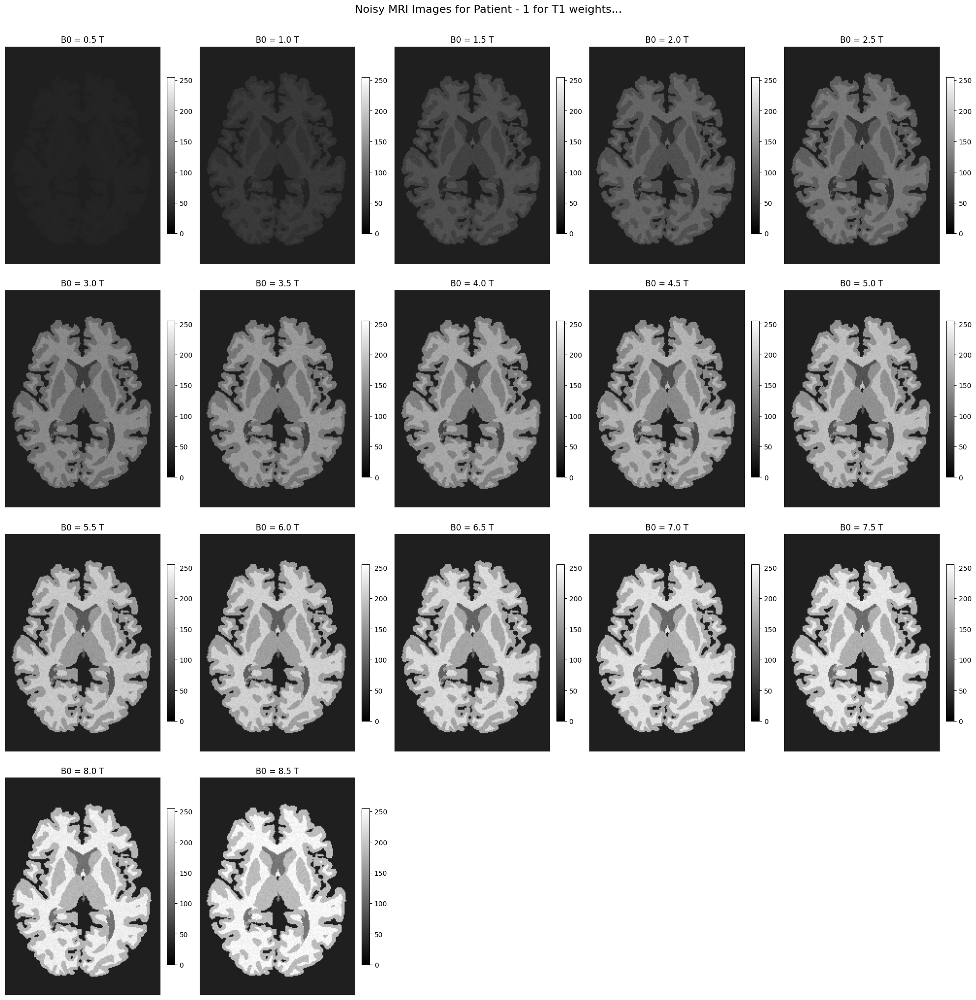

In [24]:
# Function to calculate Signal Intensity (SI) for tissue regions
def calculate_signal_intensity(si_value, noise_variance, tissue_mask):
    # Generate Gaussian noise
    noise = np.random.normal(0, noise_variance, tissue_mask.shape)
    # Calculate noisy Signal Intensity
    signal_intensity = (si_value + noise) * tissue_mask
    return signal_intensity


# Generate noisy Signal Intensity maps for each tissue
def generate_noisy_images_t1(slice_data, noise_si_df, tissue_masks):
    """
    Generate noisy Signal Intensity maps for CSF, WM, and GM tissues using precomputed SNR values.
    """
    csf_mask, wm_mask, gm_mask = tissue_masks
    noisy_images_csf, noisy_images_wm, noisy_images_gm = [], [], []

    for _, row in noise_si_df.iterrows():
        B0 = row.name  # B0 is the index of the DataFrame
        noise_variance = row["Noise"]

        # Get precomputed SNR values for each tissue
        snr_csf = row["SI_T1"]["SNR_CSF_T1"] 
        snr_wm = row["SI_T1"]["SNR_WM_T1"] 
        snr_gm = row["SI_T1"]["SNR_GM_T1"] 

        # Calculate noisy Signal Intensity maps
        noisy_csf = calculate_signal_intensity(snr_csf, noise_variance, csf_mask)
        noisy_wm = calculate_signal_intensity(snr_wm, noise_variance, wm_mask)
        noisy_gm = calculate_signal_intensity(snr_gm, noise_variance, gm_mask)

        # Append noisy images
        noisy_images_csf.append(noisy_csf)
        noisy_images_wm.append(noisy_wm)
        noisy_images_gm.append(noisy_gm)

    return noisy_images_csf, noisy_images_wm, noisy_images_gm


# Plot noisy images
def plot_noisy_images(noisy_images_csf, noisy_images_wm, noisy_images_gm, noise_si_df, title):
    """
    Plot noisy Signal Intensity maps for each B0 value.
    """
    fig, axs = plt.subplots(4, 5, figsize=(20, 20))  # 4 rows, 5 columns

    for i, (B0, row) in enumerate(noise_si_df.iterrows()):
        combined_noisy_image = (
            np.nan_to_num(noisy_images_csf[i]) +
            np.nan_to_num(noisy_images_wm[i]) +
            np.nan_to_num(noisy_images_gm[i])
        )
        normalized_mri = np.interp(combined_noisy_image, (-30, 4500), (30, 255))
        # Plot combined noisy image
        ax = axs[i // 5, i % 5]
        im = ax.imshow(normalized_mri.T, cmap="gray", origin="lower", vmin=0,vmax=255)
        ax.set_title(f"B0 = {B0} T")
        ax.axis("off")

        # Add colorbar
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        
    # Hide unused subplots if fewer than 20
    for idx in range(len(noise_si_df), 20):
        fig.delaxes(axs[idx // 5, idx % 5])

    plt.tight_layout()
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.show()


# Process noisy Signal Intensity images
def process_noisy_images(mri_data, noise_si_df, tissue_masks, title):
    """
    Generate and plot noisy Signal Intensity maps for a given modality (T1 or T2*).
    """
    noisy_images_csf, noisy_images_wm, noisy_images_gm = generate_noisy_images_t1(mri_data, noise_si_df, tissue_masks)
    plot_noisy_images(noisy_images_csf, noisy_images_wm, noisy_images_gm, noise_si_df, title)


# Main function
def noisy_images_p1_t1(mri_data, noise_si_df):
    slice_idx = 90  # Specify the slice index
    slice_data = mri_data[:, slice_idx, :]

    # Tissue masks
    gm_mask = (slice_data == 1) | (slice_data == 2)  # Grey Matter
    wm_mask = slice_data == 3                        # White Matter
    csf_mask = slice_data == 4                       # CSF
    tissue_masks = (csf_mask, wm_mask, gm_mask)

    # Process noisy images
    print("Processing noisy MRI images for Patient - 1 for T1 weights...")
    process_noisy_images(slice_data, noise_si_df, tissue_masks, "Noisy MRI Images for Patient - 1 for T1 weights...")


# Load MRI data and noise_si_df
mri_data_1 = load_patient_data('Patient1.nii.gz')

# Run the noisy image generation process
noisy_images_p1_t1(mri_data_1, noise_si_df)


#### T2* weighted Noisy plots

Processing noisy MRI images for Patient - 1 for T2 weights......


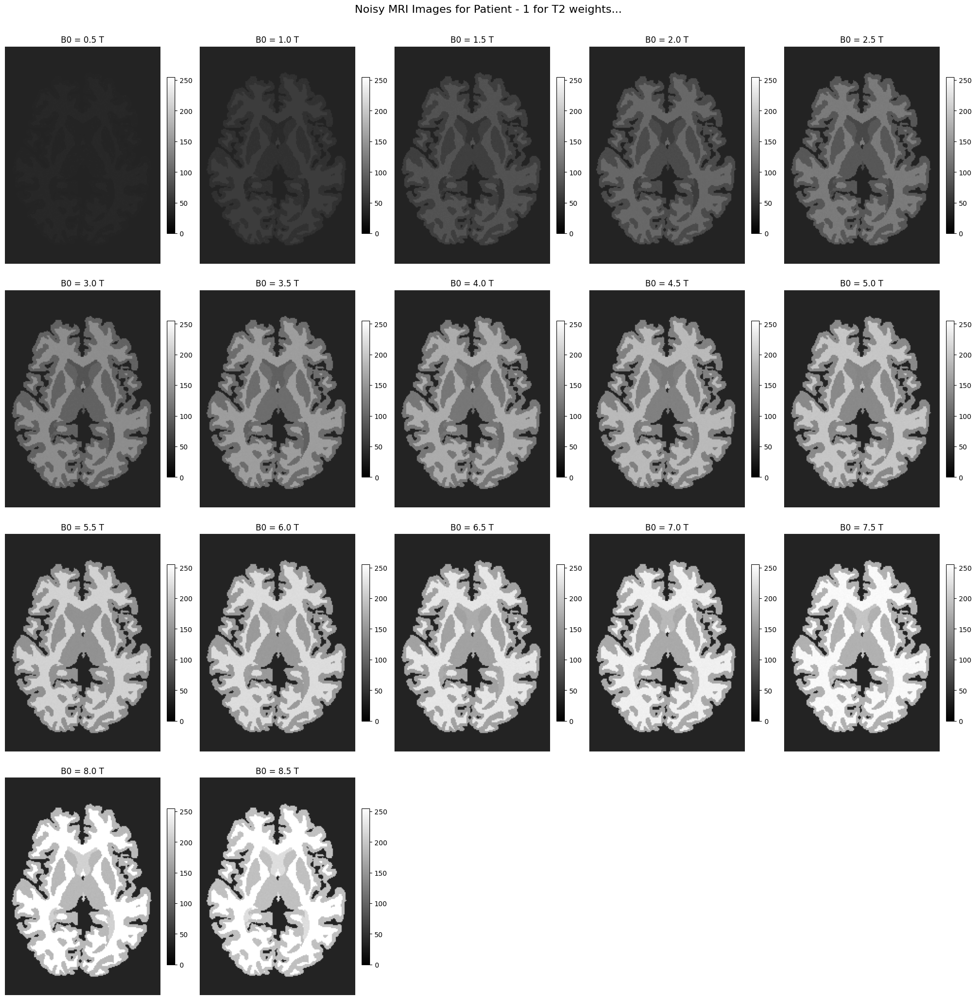

In [25]:
# Function to calculate Signal Intensity (SI) for tissue regions
def calculate_signal_intensity(snr_value, noise_variance, tissue_mask):
    """
    Calculate the Signal Intensity (SI) for tissue regions using:
    SI_tissue,B0 = SNR_tissue,B0 * σ_n + noise

    Parameters:
    - snr_value: Precomputed SNR value for the tissue.
    - noise_variance: Variance of Gaussian noise (σ_n).
    - tissue_mask: Binary mask for tissue regions.

    Returns:
    - noisy_signal_intensity: 2D array of signal intensity with noise.
    """
    # Generate Gaussian noise
    noise = np.random.normal(-noise_variance, noise_variance, tissue_mask.shape)
    # Calculate noisy Signal Intensity
    signal_intensity = (snr_value + noise) * tissue_mask
    return signal_intensity


# Generate noisy Signal Intensity maps for each tissue
def generate_noisy_images_t2(slice_data, noise_si_df, tissue_masks):
    """
    Generate noisy Signal Intensity maps for CSF, WM, and GM tissues using precomputed SNR values.
    """
    csf_mask, wm_mask, gm_mask = tissue_masks
    noisy_images_csf, noisy_images_wm, noisy_images_gm = [], [], []

    for _, row in noise_si_df.iterrows():
        B0 = row.name  # B0 is the index of the DataFrame
        noise_variance = row["Noise"]

        # Get precomputed SNR values for each tissue
        snr_csf = row["SI_T2*"]["SNR_CSF_T2*"] 
        snr_wm = row["SI_T2*"]["SNR_WM_T2*"] 
        snr_gm = row["SI_T2*"]["SNR_GM_T2*"] 

        # Calculate noisy Signal Intensity maps
        noisy_csf = calculate_signal_intensity(snr_csf, noise_variance, csf_mask)
        noisy_wm = calculate_signal_intensity(snr_wm, noise_variance, wm_mask)
        noisy_gm = calculate_signal_intensity(snr_gm, noise_variance, gm_mask)

        # Append noisy images
        noisy_images_csf.append(noisy_csf)
        noisy_images_wm.append(noisy_wm)
        noisy_images_gm.append(noisy_gm)

    return noisy_images_csf, noisy_images_wm, noisy_images_gm


# Plot noisy images
def plot_noisy_images(noisy_images_csf, noisy_images_wm, noisy_images_gm, noise_si_df, title):
    """
    Plot noisy Signal Intensity maps for each B0 value.
    """
    fig, axs = plt.subplots(4, 5, figsize=(20, 20))  # 4 rows, 5 columns

    for i, (B0, row) in enumerate(noise_si_df.iterrows()):
        combined_noisy_image = (
            np.nan_to_num(noisy_images_csf[i]) +
            np.nan_to_num(noisy_images_wm[i]) +
            np.nan_to_num(noisy_images_gm[i])
        )

        normalized_mri = np.interp(combined_noisy_image, (-2000, 17500), (10, 255))
        # Plot combined noisy image
        ax = axs[i // 5, i % 5]
        im = ax.imshow(normalized_mri.T, cmap="gray", origin="lower", vmin=0,vmax=255)
        ax.set_title(f"B0 = {B0} T")
        ax.axis("off")

        # Add colorbar
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    # Hide unused subplots if fewer than 20
    for idx in range(len(noise_si_df), 20):
        fig.delaxes(axs[idx // 5, idx % 5])

    plt.tight_layout()
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.show()


# Process noisy Signal Intensity images
def process_noisy_images(mri_data, noise_si_df, tissue_masks, title):
    """
    Generate and plot noisy Signal Intensity maps for a given modality (T1 or T2*).
    """
    noisy_images_csf, noisy_images_wm, noisy_images_gm = generate_noisy_images_t2(mri_data, noise_si_df, tissue_masks)
    plot_noisy_images(noisy_images_csf, noisy_images_wm, noisy_images_gm, noise_si_df, title)


# Main function
def noisy_images_p1_t2(mri_data, noise_si_df):
    slice_idx = 90  # Specify the slice index
    slice_data = mri_data[:, slice_idx, :]

    # Tissue masks
    gm_mask = (slice_data == 1) | (slice_data == 2)  # Grey Matter
    wm_mask = slice_data == 3                        # White Matter
    csf_mask = slice_data == 4                       # CSF
    tissue_masks = (csf_mask, wm_mask, gm_mask)

    # Process noisy images
    print("Processing noisy MRI images for Patient - 1 for T2 weights......")
    process_noisy_images(slice_data, noise_si_df, tissue_masks, "Noisy MRI Images for Patient - 1 for T2 weights...")


# Load MRI data and noise_si_df
mri_data_1 = load_patient_data('Patient1.nii.gz')

# Run the noisy image generation process
noisy_images_p1_t2(mri_data_1, noise_si_df)


### Patient - 2

#### T1 weighted Noisy plots

Processing noisy MRI images for Patient - 2 for T1 weights...


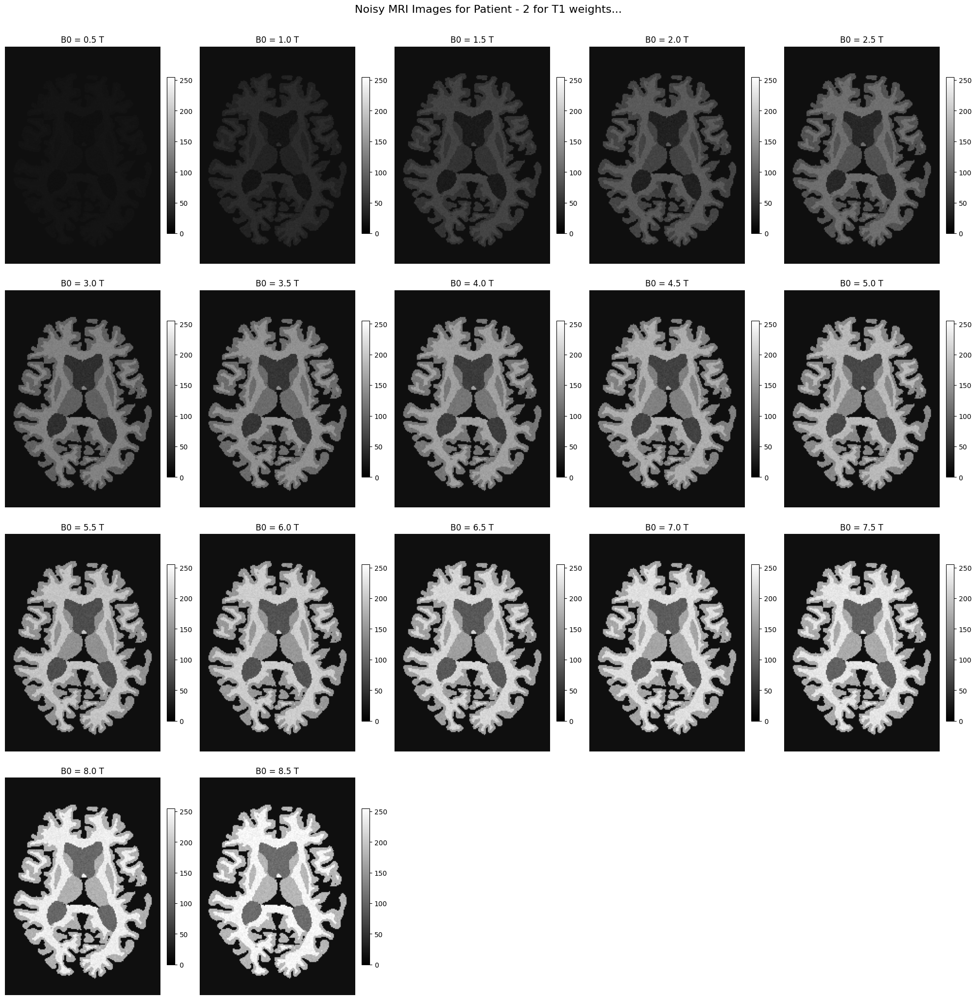

In [26]:
# Function to calculate Signal Intensity (SI) for tissue regions
def calculate_signal_intensity(snr_value, noise_variance, tissue_mask):
    """
    Calculate the Signal Intensity (SI) for tissue regions using:
    SI_tissue,B0 = SNR_tissue,B0 * σ_n + noise

    Parameters:
    - snr_value: Precomputed SNR value for the tissue.
    - noise_variance: Variance of Gaussian noise (σ_n).
    - tissue_mask: Binary mask for tissue regions.

    Returns:
    - noisy_signal_intensity: 2D array of signal intensity with noise.
    """
    # Generate Gaussian noise
    noise = np.random.normal(0, noise_variance, tissue_mask.shape)
    # Calculate noisy Signal Intensity
    signal_intensity = (snr_value + noise) * tissue_mask
    return signal_intensity


# Generate noisy Signal Intensity maps for each tissue
def generate_noisy_images_t1(slice_data, noise_si_df, tissue_masks):
    """
    Generate noisy Signal Intensity maps for CSF, WM, and GM tissues using precomputed SNR values.
    """
    csf_mask, wm_mask, gm_mask = tissue_masks
    noisy_images_csf, noisy_images_wm, noisy_images_gm = [], [], []

    for _, row in noise_si_df.iterrows():
        B0 = row.name  # B0 is the index of the DataFrame
        noise_variance = row["Noise"]

        # Get precomputed SNR values for each tissue
        snr_csf = row["SI_T1"]["SNR_CSF_T1"] 
        snr_wm = row["SI_T1"]["SNR_WM_T1"] 
        snr_gm = row["SI_T1"]["SNR_GM_T1"] 

        # Calculate noisy Signal Intensity maps
        noisy_csf = calculate_signal_intensity(snr_csf, noise_variance, csf_mask)
        noisy_wm = calculate_signal_intensity(snr_wm, noise_variance, wm_mask)
        noisy_gm = calculate_signal_intensity(snr_gm, noise_variance, gm_mask)

        # Append noisy images
        noisy_images_csf.append(noisy_csf)
        noisy_images_wm.append(noisy_wm)
        noisy_images_gm.append(noisy_gm)

    return noisy_images_csf, noisy_images_wm, noisy_images_gm


# Plot noisy images
def plot_noisy_images(noisy_images_csf, noisy_images_wm, noisy_images_gm, noise_si_df, title):
    """
    Plot noisy Signal Intensity maps for each B0 value.
    """
    fig, axs = plt.subplots(4, 5, figsize=(20, 20))  # 4 rows, 5 columns

    for i, (B0, row) in enumerate(noise_si_df.iterrows()):
        combined_noisy_image = (
            np.nan_to_num(noisy_images_csf[i]) +
            np.nan_to_num(noisy_images_wm[i]) +
            np.nan_to_num(noisy_images_gm[i])
        )
        normalized_mri = np.interp(combined_noisy_image, (-100, 4500), (10, 255))
        # Plot combined noisy image
        ax = axs[i // 5, i % 5]
        im = ax.imshow(normalized_mri.T, cmap="gray", origin="lower", vmin=0,vmax=255)
        ax.set_title(f"B0 = {B0} T")
        ax.axis("off")

        # Add colorbar
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    # Hide unused subplots if fewer than 20
    for idx in range(len(noise_si_df), 20):
        fig.delaxes(axs[idx // 5, idx % 5])

    plt.tight_layout()
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.show()


# Process noisy Signal Intensity images
def process_noisy_images(mri_data, noise_si_df, tissue_masks, title):
    """
    Generate and plot noisy Signal Intensity maps for a given modality (T1 or T2*).
    """
    noisy_images_csf, noisy_images_wm, noisy_images_gm = generate_noisy_images_t1(mri_data, noise_si_df, tissue_masks)
    plot_noisy_images(noisy_images_csf, noisy_images_wm, noisy_images_gm, noise_si_df, title)


# Main function
def noisy_images(mri_data, noise_si_df):
    slice_idx = 90  # Specify the slice index
    slice_data = mri_data[:, slice_idx, :]

    # Tissue masks
    gm_mask = (slice_data == 1) | (slice_data == 2)  # Grey Matter
    wm_mask = slice_data == 3                        # White Matter
    csf_mask = slice_data == 4                       # CSF
    tissue_masks = (csf_mask, wm_mask, gm_mask)

    # Process noisy images
    print("Processing noisy MRI images for Patient - 2 for T1 weights...")
    process_noisy_images(slice_data, noise_si_df, tissue_masks, "Noisy MRI Images for Patient - 2 for T1 weights...")


# Load MRI data and noise_si_df
mri_data_2 = load_patient_data('Patient2.nii.gz')

# Run the noisy image generation process
noisy_images(mri_data_2, noise_si_df)


#### T2* weighted Noisy plots

Processing noisy MRI images for Patient - 2 for T2 weights......


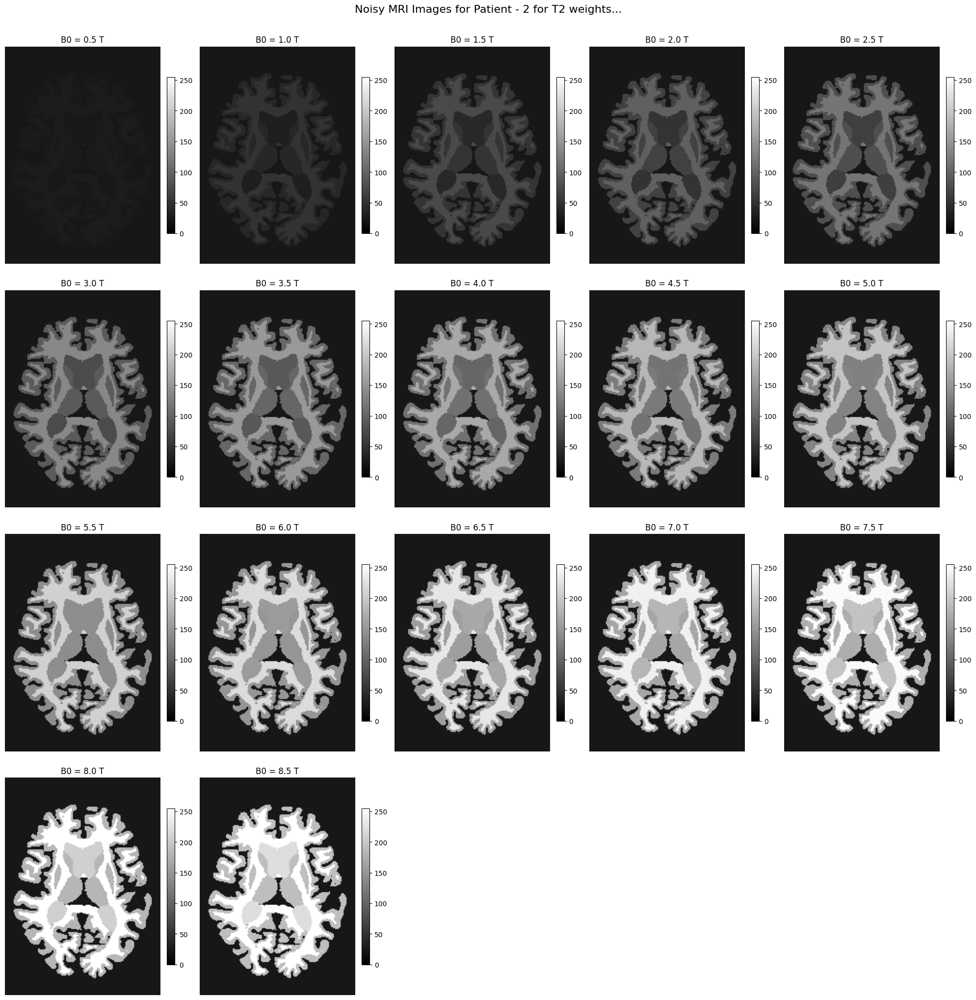

In [27]:
# Function to calculate Signal Intensity (SI) for tissue regions
def calculate_signal_intensity(snr_value, noise_variance, tissue_mask):
    """
    Calculate the Signal Intensity (SI) for tissue regions using:
    SI_tissue,B0 = SNR_tissue,B0 * σ_n + noise

    Parameters:
    - snr_value: Precomputed SNR value for the tissue.
    - noise_variance: Variance of Gaussian noise (σ_n).
    - tissue_mask: Binary mask for tissue regions.

    Returns:
    - noisy_signal_intensity: 2D array of signal intensity with noise.
    """
    # Generate Gaussian noise
    noise = np.random.normal(0, noise_variance, tissue_mask.shape)
    # Calculate noisy Signal Intensity
    signal_intensity = (snr_value + noise) * tissue_mask
    return signal_intensity


# Generate noisy Signal Intensity maps for each tissue
def generate_noisy_images_t2(slice_data, noise_si_df, tissue_masks):
    """
    Generate noisy Signal Intensity maps for CSF, WM, and GM tissues using precomputed SNR values.
    """
    csf_mask, wm_mask, gm_mask = tissue_masks
    noisy_images_csf, noisy_images_wm, noisy_images_gm = [], [], []

    for _, row in noise_si_df.iterrows():
        B0 = row.name  # B0 is the index of the DataFrame
        noise_variance = row["Noise"]

        # Get precomputed SNR values for each tissue
        snr_csf = row["SI_T2*"]["SNR_CSF_T2*"] 
        snr_wm = row["SI_T2*"]["SNR_WM_T2*"] 
        snr_gm = row["SI_T2*"]["SNR_GM_T2*"] 

        # Calculate noisy Signal Intensity maps
        noisy_csf = calculate_signal_intensity(snr_csf, noise_variance, csf_mask)
        noisy_wm = calculate_signal_intensity(snr_wm, noise_variance, wm_mask)
        noisy_gm = calculate_signal_intensity(snr_gm, noise_variance, gm_mask)

        # Append noisy images
        noisy_images_csf.append(noisy_csf)
        noisy_images_wm.append(noisy_wm)
        noisy_images_gm.append(noisy_gm)

    return noisy_images_csf, noisy_images_wm, noisy_images_gm


# Plot noisy images
def plot_noisy_images(noisy_images_csf, noisy_images_wm, noisy_images_gm, noise_si_df, title):
    """
    Plot noisy Signal Intensity maps for each B0 value.
    """
    fig, axs = plt.subplots(4, 5, figsize=(20, 20))  # 4 rows, 5 columns

    for i, (B0, row) in enumerate(noise_si_df.iterrows()):
        combined_noisy_image = (
            np.nan_to_num(noisy_images_csf[i]) +
            np.nan_to_num(noisy_images_wm[i]) +
            np.nan_to_num(noisy_images_gm[i])
        )

        normalized_mri = np.interp(combined_noisy_image, (-1000, 17500), (10, 255))
        # Plot combined noisy image
        ax = axs[i // 5, i % 5]
        im = ax.imshow(normalized_mri.T, cmap="gray", origin="lower", vmin=0,vmax=255)
        ax.set_title(f"B0 = {B0} T")
        ax.axis("off")

        # Add colorbar
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    # Hide unused subplots if fewer than 20
    for idx in range(len(noise_si_df), 20):
        fig.delaxes(axs[idx // 5, idx % 5])

    plt.tight_layout()
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.show()


# Process noisy Signal Intensity images
def process_noisy_images(mri_data, noise_si_df, tissue_masks, title):
    """
    Generate and plot noisy Signal Intensity maps for a given modality (T1 or T2*).
    """
    noisy_images_csf, noisy_images_wm, noisy_images_gm = generate_noisy_images_t2(mri_data, noise_si_df, tissue_masks)
    plot_noisy_images(noisy_images_csf, noisy_images_wm, noisy_images_gm, noise_si_df, title)


# Main function
def noisy_images(mri_data, noise_si_df):
    slice_idx = 90  # Specify the slice index
    slice_data = mri_data[:, slice_idx, :]

    # Tissue masks
    gm_mask = (slice_data == 1) | (slice_data == 2)  # Grey Matter
    wm_mask = slice_data == 3                        # White Matter
    csf_mask = slice_data == 4                       # CSF
    tissue_masks = (csf_mask, wm_mask, gm_mask)

    # Process noisy images
    print("Processing noisy MRI images for Patient - 2 for T2 weights......")
    process_noisy_images(slice_data, noise_si_df, tissue_masks, "Noisy MRI Images for Patient - 2 for T2 weights...")


# Load MRI data and noise_si_df
mri_data_2 = load_patient_data('Patient2.nii.gz')

# Run the noisy image generation process
noisy_images(mri_data_2, noise_si_df)


### MRI Resolution

In [28]:
def create_snr_map_T1(patient_id, slice_number, snr_values):
    masks = get_mask(patient_id, slice_number)
    all_mask 
    snr_map = np.zeros_like(masks['total_brain_mask'], dtype=float)
    
    snr_map[masks['gm_mask']] = snr_values['SNR_GM_T1']
    snr_map[masks['wm_mask']] = snr_values['SNR_WM_T1']
    snr_map[masks['csf_mask']] = snr_values['SNR_CSF_T1']
    
    return snr_map

def create_snr_map_T2(patient_id, slice_number, snr_values):
    masks = get_mask(patient_id, slice_number)
    all_mask 
    snr_map = np.zeros_like(masks['total_brain_mask'], dtype=float)
    
    snr_map[masks['gm_mask']] = snr_values['SNR_GM_T2*']
    snr_map[masks['wm_mask']] = snr_values['SNR_WM_T2*']
    snr_map[masks['csf_mask']] = snr_values['SNR_CSF_T2*']
    
    return snr_map

In [29]:
noisy_mri_storage = {}

slice_number = 90
patient_ids = ['patient1', 'patient2']

selected_B0_values = [3]

for patient_id in patient_ids:
    noisy_mri_storage[patient_id] = {}

    for B0_level in selected_B0_values:
        noisy_mri_storage[patient_id][B0_level] = {} 
        
        t1_si_values = noise_si_df.at[B0_level, "SI_T1"]
        sigma_n_t1 = noise_si_df.at[B0_level, "Noise"]
        t1_si_map = create_snr_map_T1(patient_id, slice_number, t1_si_values)
        t1_noisy_mri = add_noise(t1_si_map, sigma_n_t1)
        noisy_mri_storage[patient_id][B0_level]["T1"] = t1_noisy_mri

        # Generate and store T2 noisy MRI
        t2_si_values = noise_si_df.at[B0_level, "SI_T2*"]
        sigma_n_t2 = noise_si_df.at[B0_level, "Noise"]
        t2_si_map = create_snr_map_T2(patient_id, slice_number, t2_si_values)
        t2_noisy_mri = add_noise(t2_si_map, sigma_n_t2)
        noisy_mri_storage[patient_id][B0_level]["T2"] = t2_noisy_mri



In [30]:
print("Structure of noisy_mri_storage:")
for patient_id, b0_data in noisy_mri_storage.items():
    print(f"Patient: {patient_id}")
    for b0, modalities in b0_data.items():
        print(f"  B0: {b0}")
        for modality, data in modalities.items():
            print(f"    Modality: {modality}, Shape: {data.shape}")

Structure of noisy_mri_storage:
Patient: patient1
  B0: 3
    Modality: T1, Shape: (160, 192, 224)
    Modality: T2, Shape: (160, 192, 224)
Patient: patient2
  B0: 3
    Modality: T1, Shape: (160, 192, 224)
    Modality: T2, Shape: (160, 192, 224)


#### Resampling the image

In [31]:

def resample_data(data, in_plane_factor, slice_thickness_factor):

    slice_thickness_shape = (data.shape[0], int(data.shape[1] * slice_thickness_factor), data.shape[2])

    data_resampled_slice_thickness = resize(data, 
                                            slice_thickness_shape, 
                                            order=1,  # Using Bilinear interpolation
                                            mode='reflect', 
                                            anti_aliasing=True, 
                                            preserve_range=True)
    
    in_plane_shape = (int(data_resampled_slice_thickness.shape[0] * in_plane_factor), 
                      data_resampled_slice_thickness.shape[1], 
                      int(data_resampled_slice_thickness.shape[2] * in_plane_factor))

    data_resampled_in_plane = resize(data_resampled_slice_thickness, 
                                      in_plane_shape, 
                                      order=2,  # Using Cubic interpolation
                                      mode='reflect', 
                                      anti_aliasing=True, 
                                      preserve_range=True)
    
    return data_resampled_in_plane

#### Preparing for thickness calculation

In [32]:
slice_thicknesses = [1, 2, 5, 10]  # Slice thicknesses in mm
in_plane_resolutions = [1, 2]  # In-plane resolutions in mm
patients = ['patient1', 'patient2']

resampled_storage = {}

for patient_id in patients:
    resampled_storage[patient_id] = {}
    
    for B0_level in selected_B0_values:
        resampled_storage[patient_id][B0_level] = {}
        
        for in_plane in in_plane_resolutions:
            for thickness in slice_thicknesses:
                in_plane_factor = 1 / in_plane 
                slice_thickness_factor = 1 / thickness 

                original_data = noisy_mri_storage[patient_id][B0_level]["T1"]
                resampled_data = resample_data(original_data, in_plane_factor, slice_thickness_factor)
                
                key = f"T1 {in_plane}mm_inplane_{thickness}mm_thickness"
                resampled_storage[patient_id][B0_level][key] = resampled_data

                original_data = noisy_mri_storage[patient_id][B0_level]["T2"]
                resampled_data = resample_data(original_data, in_plane_factor, slice_thickness_factor)
                
                key = f"T2* {in_plane}mm_inplane_{thickness}mm_thickness"
                resampled_storage[patient_id][B0_level][key] = resampled_data

#### Thickness calculations

In [33]:
# Display structure of resampled data storage
print("Structure of resampled_storage:")
for patient_id, b0_data in resampled_storage.items():
    print(f"Patient: {patient_id}")
    for b0, resolutions in b0_data.items():
        print(f"  B0: {b0}")
        for resolution, data in resolutions.items():
            print(f"    Resolution: {resolution}, Shape: {data.shape}")

Structure of resampled_storage:
Patient: patient1
  B0: 3
    Resolution: T1 1mm_inplane_1mm_thickness, Shape: (160, 192, 224)
    Resolution: T2* 1mm_inplane_1mm_thickness, Shape: (160, 192, 224)
    Resolution: T1 1mm_inplane_2mm_thickness, Shape: (160, 96, 224)
    Resolution: T2* 1mm_inplane_2mm_thickness, Shape: (160, 96, 224)
    Resolution: T1 1mm_inplane_5mm_thickness, Shape: (160, 38, 224)
    Resolution: T2* 1mm_inplane_5mm_thickness, Shape: (160, 38, 224)
    Resolution: T1 1mm_inplane_10mm_thickness, Shape: (160, 19, 224)
    Resolution: T2* 1mm_inplane_10mm_thickness, Shape: (160, 19, 224)
    Resolution: T1 2mm_inplane_1mm_thickness, Shape: (80, 192, 112)
    Resolution: T2* 2mm_inplane_1mm_thickness, Shape: (80, 192, 112)
    Resolution: T1 2mm_inplane_2mm_thickness, Shape: (80, 96, 112)
    Resolution: T2* 2mm_inplane_2mm_thickness, Shape: (80, 96, 112)
    Resolution: T1 2mm_inplane_5mm_thickness, Shape: (80, 38, 112)
    Resolution: T2* 2mm_inplane_5mm_thickness, Shap

In [34]:
def assign_tissue_mask(matrix, b0, si_type):
    """
    Assign tissue masks based on the signal intensity matrix and the given B0 value.

    Parameters:
    - matrix: 2D array of signal intensities.
    - b0: Magnetic field strength (B0 value).
    - si_type: Type of signal intensity ("T1" or "T2*").

    Returns:
    - A dictionary containing binary masks for each tissue type (GM, WM, CSF, background).
    """
    # Select the appropriate data columns based on the signal intensity type
    data = noise_si_df[["SNR_T1", "Noise", "SI_T1"]] if si_type == "T1" else noise_si_df[["SNR_T2*", "Noise", "SI_T2*"]]
    
    si_column = f'SI_{si_type}'
    si_values = data.at[b0, si_column]
    noise_level = data.at[b0, "Noise"]
    
    print(si_values)

    # Define mean signal intensities for each tissue
    tissue_means = {
        "CSF": si_values[f"SNR_CSF_{si_type}"],
        "GM": si_values[f"SNR_GM_{si_type}"],
        "WM": si_values[f"SNR_WM_{si_type}"],
        "BG": 0  # Background has a mean intensity of 0
    }

    # Define standard deviations for each tissue
    tissue_stds = {
        "CSF": noise_level,
        "GM": noise_level,
        "WM": noise_level,
        "BG": 0.01  # Small standard deviation for background
    }

    # Store probabilities for each tissue type
    probabilities = {}
    flattened_matrix = matrix.flatten()  # Flatten the matrix for easier processing

    # Calculate probabilities for each tissue type
    for tissue, mean in tissue_means.items():
        std_dev = tissue_stds[tissue]
        probabilities[tissue] = norm.pdf(flattened_matrix, mean, std_dev)

    # Assign tissue labels based on the highest probability
    tissue_labels = np.argmax(
        [probabilities["CSF"], probabilities["GM"], probabilities["WM"], probabilities["BG"]], 
        axis=0
    )
    
    tissue_labels = tissue_labels.reshape(matrix.shape)  # Reshape to the original matrix shape

    # Create binary masks for each tissue type
    csf_mask = (tissue_labels == 0)
    gm_mask = (tissue_labels == 1)
    wm_mask = (tissue_labels == 2)
    background_mask = (tissue_labels == 3)

    return {
        'gm_mask': gm_mask,
        'wm_mask': wm_mask,
        'csf_mask': csf_mask,
        'background_mask': background_mask
    }


#### Calculating contrast between Grey Matter (GM) and Cerebrospinal Fluid (CSF) regions 

In [35]:
def get_contrast(matrix, tissue_masks):
    """
    Calculate the contrast between Grey Matter (GM) and Cerebrospinal Fluid (CSF) regions.

    Parameters:
    - matrix: 2D array of signal intensities.
    - tissue_masks: Dictionary containing binary masks for GM, CSF, WM, and background.

    Returns:
    - contrast: A value representing the contrast between GM and CSF, calculated as:
                |Mean(GM) - Mean(CSF)| / (Mean(GM) + Mean(CSF)).
                Returns 0 if both GM and CSF means are 0.
    """
    # Extract the masks for GM and CSF
    gm_mask = tissue_masks['gm_mask']
    csf_mask = tissue_masks['csf_mask']
    
    # Calculate the mean intensity for GM and CSF
    gm_mean = np.mean(matrix[gm_mask]) if np.any(gm_mask) else 0
    csf_mean = np.mean(matrix[csf_mask]) if np.any(csf_mask) else 0
    
    # Return 0 if the sum of GM and CSF means is zero
    if gm_mean + csf_mean == 0:
        return 0 
    
    # Calculate and return contrast
    contrast = abs(gm_mean - csf_mean) / (gm_mean + csf_mean)
    return contrast


#### Calculating Peak Signal-to-Noise Ratio (PSNR)

In [36]:
def compute_psnr(image1, image2):
    """
    Compute the Peak Signal-to-Noise Ratio (PSNR) between two images.

    Parameters:
    - image1: First image (ground truth or original).
    - image2: Second image (noisy or resampled).

    Returns:
    - PSNR: The Peak Signal-to-Noise Ratio in decibels (dB).
            If the Mean Squared Error (MSE) is zero, returns 100 (indicating no noise).
    """
    # Compute the Mean Squared Error (MSE) between the two images
    mse = np.mean((image1 - image2) ** 2)
    if mse == 0:
        return 100  # Return a high PSNR value if no noise is present (MSE = 0)
    # Calculate and return the PSNR value in decibels
    return 20 * np.log10(np.max(image1) / np.sqrt(mse))

#### Calculating Root Mean Squared Error (RMSE) between two images

In [37]:
def compute_rmse(image1, image2):
    """
    Compute the Root Mean Squared Error (RMSE) between two images.

    Parameters:
    - image1: First image (ground truth or original).
    - image2: Second image (noisy or resampled).

    Returns:
    - RMSE: The Root Mean Squared Error value.
    """
    # Compute the RMSE value
    return np.sqrt(np.mean((image1 - image2) ** 2))

#### Normalized Cross-Correlation (NCC) between two images

In [38]:
def compute_ncc(image1, image2):
    """
    Compute the Normalized Cross-Correlation (NCC) between two images.

    Parameters:
    - image1: First image (ground truth or original).
    - image2: Second image (noisy or resampled).

    Returns:
    - NCC: A value representing the normalized cross-correlation between the two images.
           This value indicates similarity, with 1 being a perfect match.
    """
    # Compute the mean-centered product of the two images
    numerator = np.sum((image1 - np.mean(image1)) * (image2 - np.mean(image2)))
    # Compute the product of the norms of the two images
    denominator = np.linalg.norm(image1) * np.linalg.norm(image2)
    # Return the NCC value
    return numerator / denominator

In [39]:
evaluation_metrics = []

def plot_original_vs_resampled(patient_id, B0_level, in_plane_resolutions, slice_thicknesses, modality):
    n_rows = len(in_plane_resolutions)
    n_cols = len(slice_thicknesses)

    slice_number = 90

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 4))
    axes = axes.flatten()

    plot_idx = 0

    main_title = f"{modality} Noisy SI Map for {patient_id},  B0: {B0_level}T"
    plt.suptitle(main_title, fontsize=16, y=1.05) 

    for in_plane in in_plane_resolutions:
        for thickness in slice_thicknesses:
            resampled_key = f"{modality} {in_plane}mm_inplane_{thickness}mm_thickness"
            resampled_data = resampled_storage[patient_id][B0_level][resampled_key]
            resampled_slice = resampled_data[:, slice_number // thickness, :]

            original_key = f"{modality} {in_plane}mm_inplane_{1}mm_thickness"
            original_data = resampled_storage[patient_id][B0_level][original_key]
            original_slice = original_data[:, slice_number, :]

            tissue_masks = assign_tissue_mask(resampled_slice, B0_level, modality)
            contrast = get_contrast(resampled_slice, tissue_masks)
            psnr_value = compute_psnr(resampled_slice, original_slice)
            rmse_value = compute_rmse(resampled_slice, original_slice)
            ncc_value = compute_ncc(resampled_slice, original_slice)

            evaluation_metrics.append({
                'Patient ID': patient_id,
                'B0 Level': B0_level,
                'Modality': modality,
                'In-plane Resolution': in_plane,
                'Slice Thickness': thickness,
                'Slice Number': slice_number // thickness,
                'Contrast': contrast,
                'PSNR': psnr_value,
                'RMSE': rmse_value,
                'NCC': ncc_value,
                'Original Key': original_key,
                'Resampled Key': resampled_key
            })

            # Add plot
            axes[plot_idx].imshow(resampled_slice.T, cmap='gray', origin='lower')
            title = f'{in_plane}mm x {in_plane}mm, Thickness - {thickness}mm'
            if thickness == 1:  # Add "Base Plot" for 1mm thickness
                title = "Base Plot for comparision\n" + title
            axes[plot_idx].set_title(title)
            axes[plot_idx].axis('off')

            # Add metrics as text below each plot
            axes[plot_idx].text(0.5, -0.01, 
                                f'Contrast: {contrast:.3f}\n'
                                f'PSNR: {psnr_value:.2f}\n'
                                f'RMSE: {rmse_value:.3f}\n'
                                f'NCC: {ncc_value:.3f}',
                                ha='center', va='top', fontsize=10, color='black', transform=axes[plot_idx].transAxes)
            plot_idx += 1 
    
    plt.subplots_adjust(top=0.9, hspace=0.2, wspace=0.2)
    plt.tight_layout()
    plt.show()


#### Thickness Resampling for both Patient - 1 and Patient - 2 for B0 = 3T with respective to T1 weights

{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}


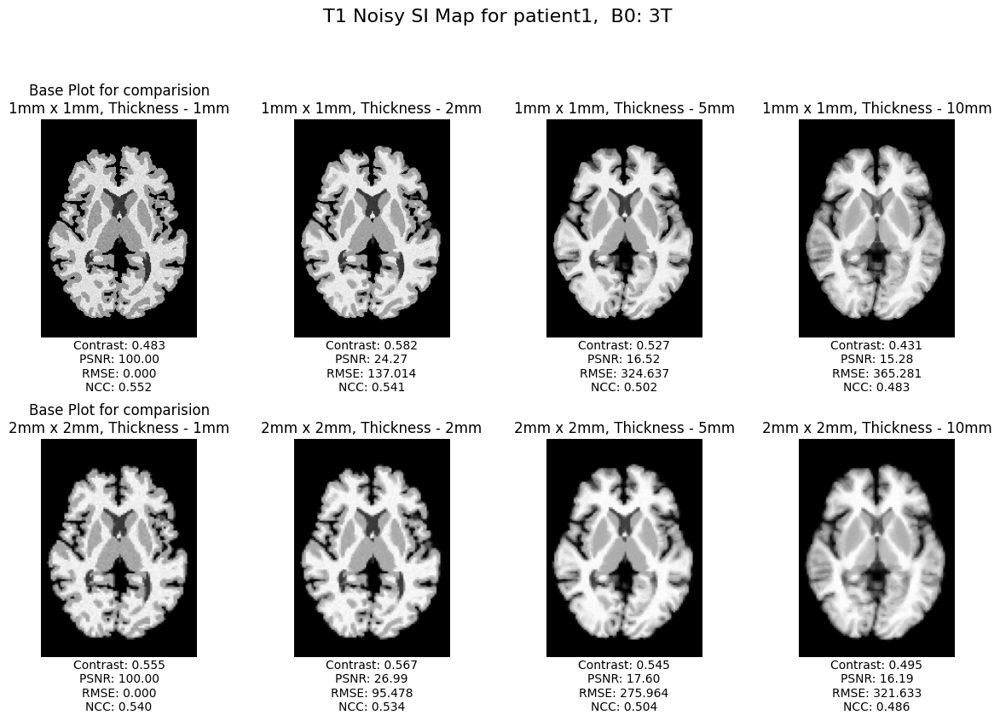

{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}
{'SNR_WM_T1': np.float64(2127.6064), 'SNR_GM_T1': np.float64(1508.206), 'SNR_CSF_T1': np.float64(584.3219)}


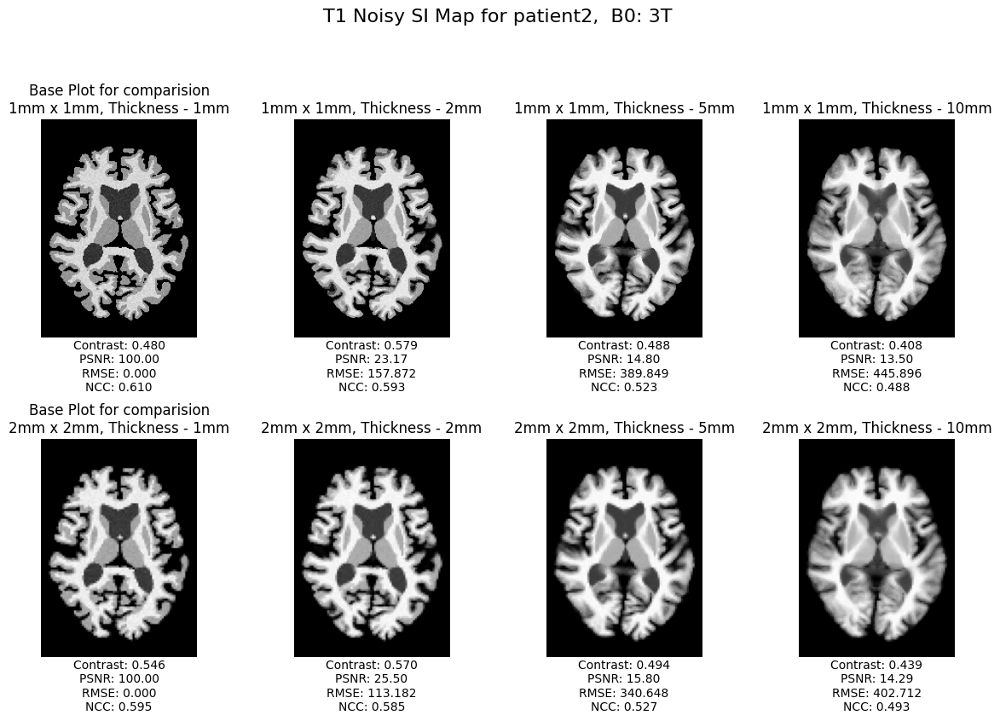

In [40]:
for patient_id in patients:
    for B0_level in selected_B0_values:
        plot_original_vs_resampled(patient_id, B0_level, in_plane_resolutions, slice_thicknesses, modality='T1')

#### Thickness Resampling for both Patient - 1 and Patient - 2 for B0 = 3T with respective to T1 weights

{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}


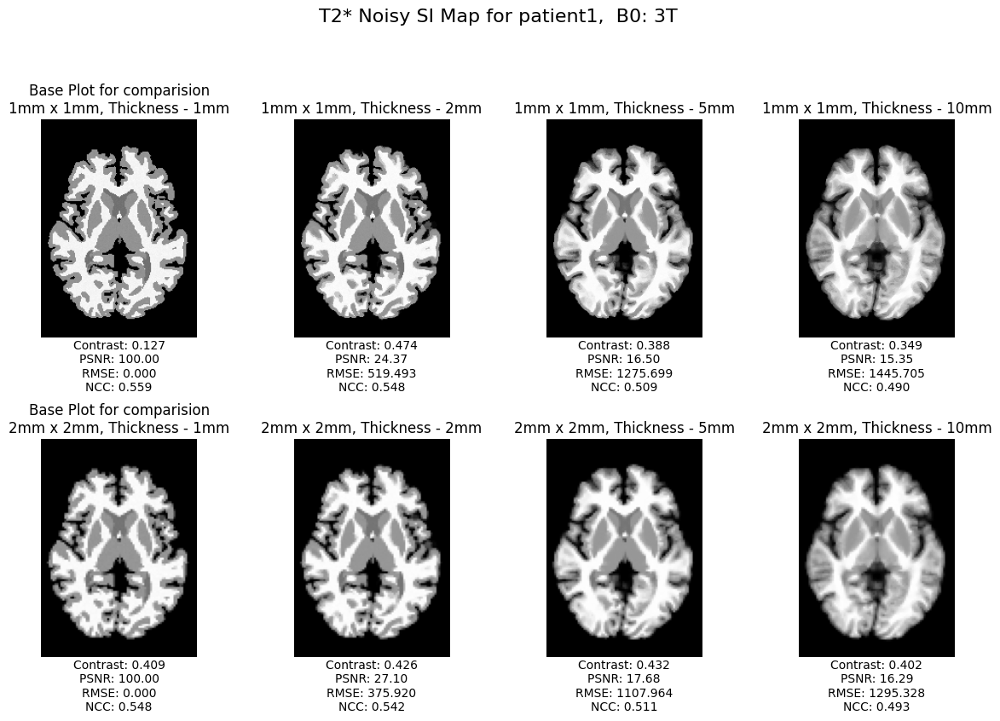

{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}
{'SNR_WM_T2*': np.float64(8478.0838), 'SNR_GM_T2*': np.float64(5101.9009), 'SNR_CSF_T2*': np.float64(3968.698)}


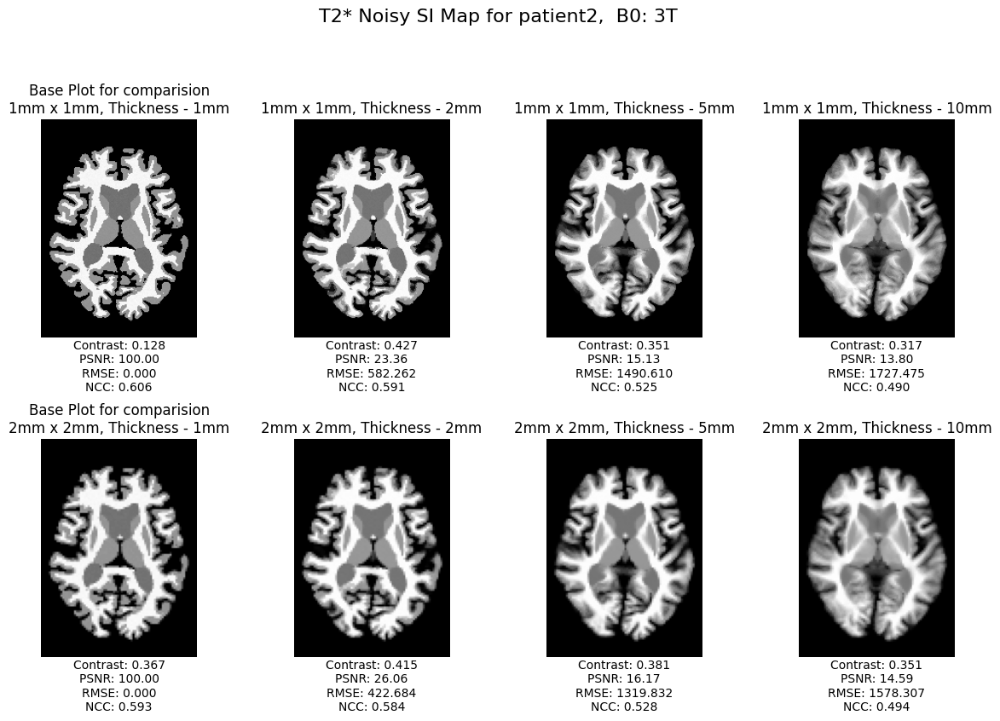

In [41]:
for patient_id in patients:
    for B0_level in selected_B0_values:
        plot_original_vs_resampled(patient_id, B0_level, in_plane_resolutions, slice_thicknesses, modality='T2*')

In [42]:
resample_metrics_df = pd.DataFrame(evaluation_metrics)
resample_metrics_df.to_csv(f"resample_metrics.csv", index=False)

In [43]:
def plot_resampled_data_metrics(y_axis_column):
    resample_metrics_df = pd.read_csv("resample_metrics.csv")

    patients = ['patient1', 'patient2']
    modalities = ['T1', 'T2*']

    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))
    axes = axes.flatten()

    plot_index = 0 

    # Define new colors for the plots
    color_1mm = 'green'  # Color for 1mm In-plane Resolution
    color_2mm = 'orange'  # Color for 2mm In-plane Resolution

    for patient in patients:
        for modality in modalities:
            ax = axes[plot_index] 

            patient_data = resample_metrics_df[
                (resample_metrics_df['Patient ID'] == patient) & 
                (resample_metrics_df['Modality'] == modality)
            ]

            thickness_1mm = patient_data[patient_data['In-plane Resolution'] == 1]
            thickness_2mm = patient_data[patient_data['In-plane Resolution'] == 2]

            ax.plot(
                thickness_1mm['Slice Thickness'], 
                thickness_1mm[y_axis_column], 
                label='1mm In-plane', 
                color=color_1mm, 
                marker='o'
            ) 
            ax.plot(
                thickness_2mm['Slice Thickness'], 
                thickness_2mm[y_axis_column], 
                label='2mm In-plane', 
                color=color_2mm, 
                marker='x'
            ) 

            ax.set_xlabel('Slice Thickness')
            ax.set_ylabel(y_axis_column)
            ax.set_title(f'{patient} - {modality}')
            ax.grid(True)
            ax.legend()

            plot_index += 1 

    plt.tight_layout()
    plt.show()


#### Metrics Analysis: comparing Contrast for different thickness for both patients, Patient-1 and Patient-2

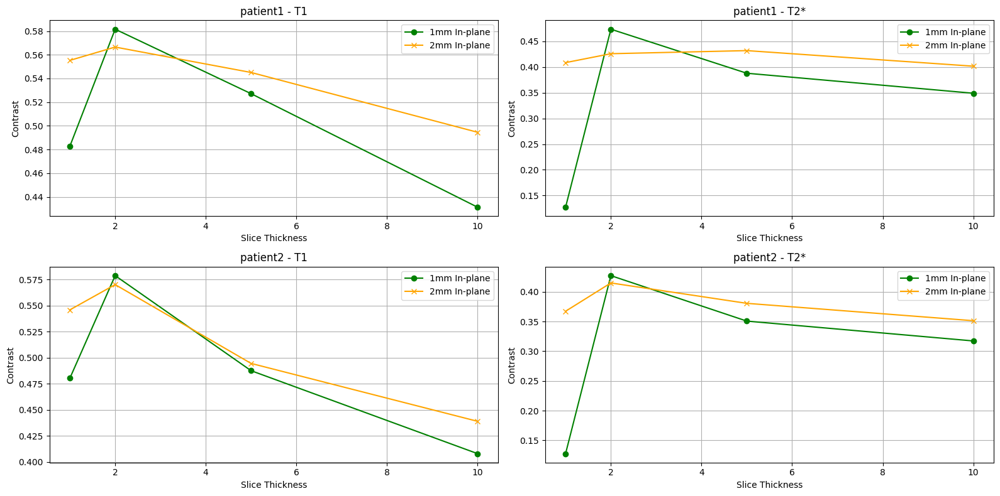

In [44]:
plot_resampled_data_metrics('Contrast')

#### Metrics Analysis: comparing Peak Signal-to-Noise Ratio (PSNR) for different thickness for both patients, Patient-1 and Patient-2

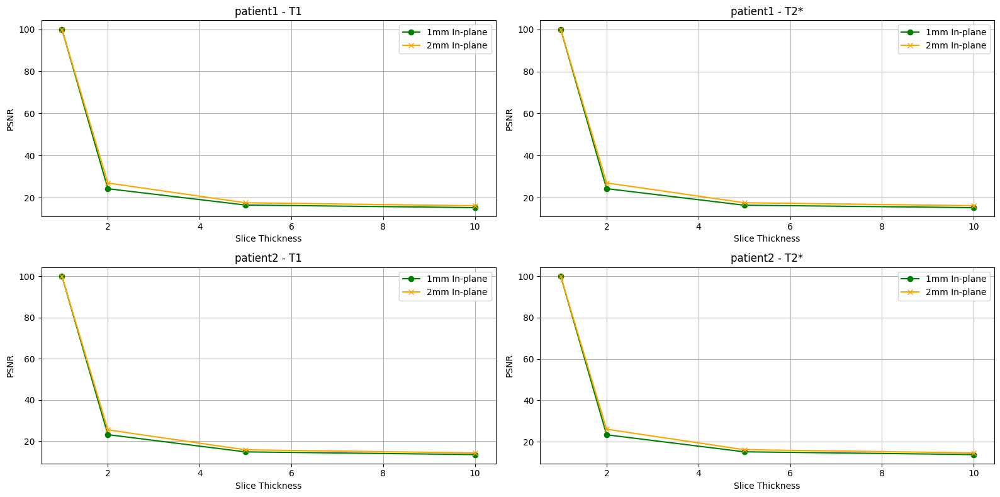

In [45]:
plot_resampled_data_metrics('PSNR')

#### Metrics Analysis: comparing Root Mean Square Errors(RMSE) for different thickness for both patients, Patient-1 and Patient-2

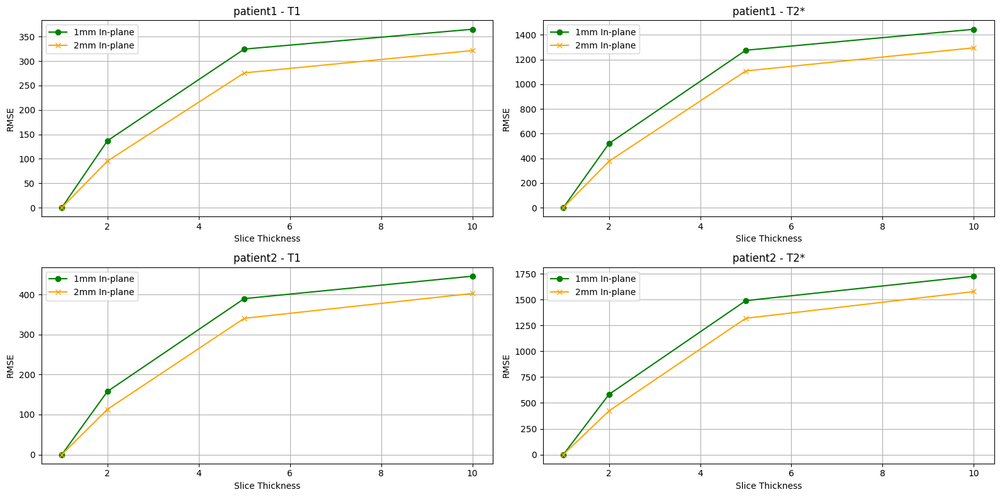

In [46]:
plot_resampled_data_metrics('RMSE')

#### Metrics Analysis: comparing Normalized Cross-Correlation (NCC) for different thickness for both patients, Patient-1 and Patient-2


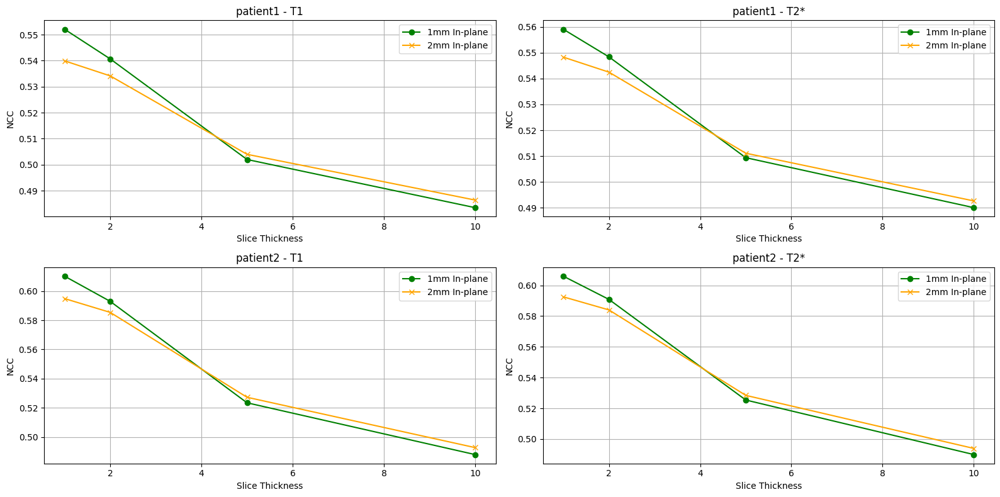

In [47]:
plot_resampled_data_metrics('NCC')

### Metrics Analysis for differnt B0 values

#### Gradient Entropy and Sharpness Profile Calculation

In [48]:
def sigmoid(x, L, x0, k, b):
    """
    Sigmoid function for modeling sharpness profile.
    """
    exp_term = np.clip(k * (x - x0), -500, 500)
    return L / (1 + np.exp(-exp_term)) + b

def compute_gradient_entropy(map_2d, threshold=0):

    # Compute the gradient magnitude of the map
    gradient_magnitude = gaussian_gradient_magnitude(map_2d, sigma=1)

    # Filter out values below the threshold (background removal)
    gradient_magnitude = gradient_magnitude[map_2d > threshold]

    if gradient_magnitude.size == 0:
        return 0  # Return zero if no pixels are left

    # Compute histogram of the gradient magnitude
    hist, _ = np.histogram(gradient_magnitude, bins=256, density=True)

    # Remove zero values to avoid log(0)
    hist = hist[hist > 0]

    # Calculate entropy
    entropy = -np.sum(hist * np.log2(hist))
    return entropy

def compute_sharpness_profile(combined_map, csf_mask, wm_mask, angle=90):

    combined_tissue_mask = np.logical_or(csf_mask > 0, wm_mask > 0)

    masked_combined_map = combined_map * combined_tissue_mask
    rotated_map = rotate(masked_combined_map, angle, reshape=False)

    line_profile = rotated_map[rotated_map.shape[1] // 2, :]

    valid_indices = line_profile > 0
    line_profile = line_profile[valid_indices]

    if len(line_profile) == 0:
        raise ValueError("No valid intensity values found along the selected line.")
    x_data = np.arange(len(line_profile))
    initial_guess = [np.max(line_profile), len(line_profile) // 2, 1.0, np.min(line_profile)]  # Initial guess

    try:
        # Fit the sigmoid function to the line profile
        popt, _ = curve_fit(sigmoid, x_data, line_profile, p0=initial_guess, maxfev=10000)
        sharpness = popt[2]  # Steepness of the sigmoid
    except RuntimeError:
        # Fallback if fitting fails
        sharpness = np.max(np.gradient(line_profile)) - np.min(np.gradient(line_profile))

    return sharpness, line_profile

In [49]:
def analyze_maps(patient_id, slice_number, snr_type, noise_si_t1, noise_si_t2):
    """
    Plot all noisy SI maps for a given patient and slice, normalizing values across all B0 levels.

    Args:
        patient_id (int): Patient ID.
        slice_number (int): Slice number to display.
        snr_type (str): SNR type ('T1' or 'T2').
        noise_si_t1 (pd.DataFrame): SI data for T1 with noise information.
        noise_si_t2 (pd.DataFrame): SI data for T2 with noise information.
    """
    si_data = noise_si_t1 if snr_type == 'T1' else noise_si_t2
    si_column = f'SI_{snr_type}'
    tissues = ['gm','wm','csf']
    snr_column = f'SNR_{snr_type}'
    results = {
        "combined_snr_maps": [],
        "noisy_si_maps": [],
        "gradient_entropies": {tissue: [] for tissue in tissues},
        "sharpness_values": [],
    }
    
    B0_levels = si_data.index

    # Calculate global min and max for normalization
    global_min = float('inf')
    global_max = float('-inf')

    # First pass: Find global min and max
    for B0_level in B0_levels:
        si_values = si_data.at[B0_level, si_column]
        snr_values = si_data.at[B0_level, snr_column]
        sigma_n = si_data.at[B0_level, 'Noise']
        if(snr_type == 'T1'):
            si_map = create_snr_map_T1(patient_id, slice_number, si_values)
            snr_map = create_snr_map_T1(patient_id, slice_number, snr_values)
        else:
            si_map = create_snr_map_T2(patient_id, slice_number, si_values)
            snr_map = create_snr_map_T2(patient_id, slice_number, snr_values)
        mri_noisy = add_noise(si_map, sigma_n)
        global_min = min(global_min, mri_noisy.min())
        global_max = max(global_max, mri_noisy.max())

    # Set normalization range
    new_min, new_max = 2, 255

    # Second pass: Normalize and plot
    for i, B0_level in enumerate(B0_levels):
        si_values = si_data.at[B0_level, si_column]
        sigma_n = si_data.at[B0_level, 'Noise']
        if(snr_type == 'T1'):
            si_map = create_snr_map_T1(patient_id, slice_number, si_values)
        else:
            si_map = create_snr_map_T2(patient_id, slice_number, si_values)
        mri_noisy = add_noise(si_map, sigma_n)
        
        for tissue in tissues:
            tissue_slice = get_mask(patient_id, slice_number)[f'{tissue}_mask'] * mri_noisy
            tissue_slice = tissue_slice[:, slice_number, :]
            # Compute gradient entropy
            g_entropy = compute_gradient_entropy(tissue_slice, threshold=0)
            results["gradient_entropies"][tissue].append(g_entropy)

        sharpness, _ = compute_sharpness_profile(mri_noisy[:, slice_number, :], get_mask(patient_id, slice_number)['csf_mask'][:, slice_number, :], get_mask(patient_id, slice_number)['wm_mask'][:, slice_number, :], angle=90)
        results["sharpness_values"].append(sharpness)

    return results

In [50]:
# Function to plot Gradient Entropy vs. B0
def plot_gradient_entropy(patient_id, snr_type, g_entropy_values, tissues):
    """
    Plots Gradient Entropy (gEn) against Magnetic Field Strength (B0) for different tissues.

    Parameters:
    - patient_id: Identifier for the patient (e.g., "Patient1").
    - snr_type: SNR type ("T1" or "T2*").
    - g_entropy_values: Dictionary containing Gradient Entropy values for each tissue.
    - tissues: List of tissue types to plot.
    - B0_values: List of Magnetic Field Strengths.
    """
    plt.figure(figsize=(10, 6))
    colors = ['blue', 'green', 'orange', 'purple']  # New colors for different tissues
    for i, tissue in enumerate(tissues):
        plt.plot(B0_values, g_entropy_values[tissue], marker='o', linestyle='-', color=colors[i % len(colors)], label=tissue)
    
    plt.xlabel('Magnetic Field Strength (T)', fontsize=12)
    plt.ylabel('Gradient Entropy (gEn)', fontsize=12)
    plt.title(f"{patient_id} {'T1' if snr_type == 'T1' else 'T2*'}-weighted Gradient Entropy vs. Magnetic Field Strength", fontsize=14)
    plt.legend(title="Tissues", fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Function to plot Sharpness vs. B0
def plot_sharpness(patient_id, snr_type, sharpness_values):
    """
    Plots Sharpness against Magnetic Field Strength (B0).

    Parameters:
    - patient_id: Identifier for the patient (e.g., "Patient1").
    - snr_type: SNR type ("T1" or "T2*").
    - sharpness_values: List of Sharpness values.
    - B0_values: List of Magnetic Field Strengths.
    """
    plt.figure(figsize=(10, 6))
    plt.plot(B0_values, sharpness_values, marker='s', linestyle='-', color='darkred', label="CSF to WM")
    
    plt.xlabel('Magnetic Field Strength (T)', fontsize=12)
    plt.ylabel('Sharpness', fontsize=12)
    plt.title(f"{patient_id} {'T1' if snr_type == 'T1' else 'T2*'}-weighted Sharpness vs. Magnetic Field Strength for CSF to WM", fontsize=14)
    plt.legend(title="Contrast Boundary", fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


#### Patient - 1 T1 weighted Gradient Entropy vs. Magnetic Field Strength

/var/folders/2c/0yq9xjkj0hx8p523v5t2pwwr0000gn/T/ipykernel_55923/1311830426.py:48: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(sigmoid, x_data, line_profile, p0=initial_guess, maxfev=10000)


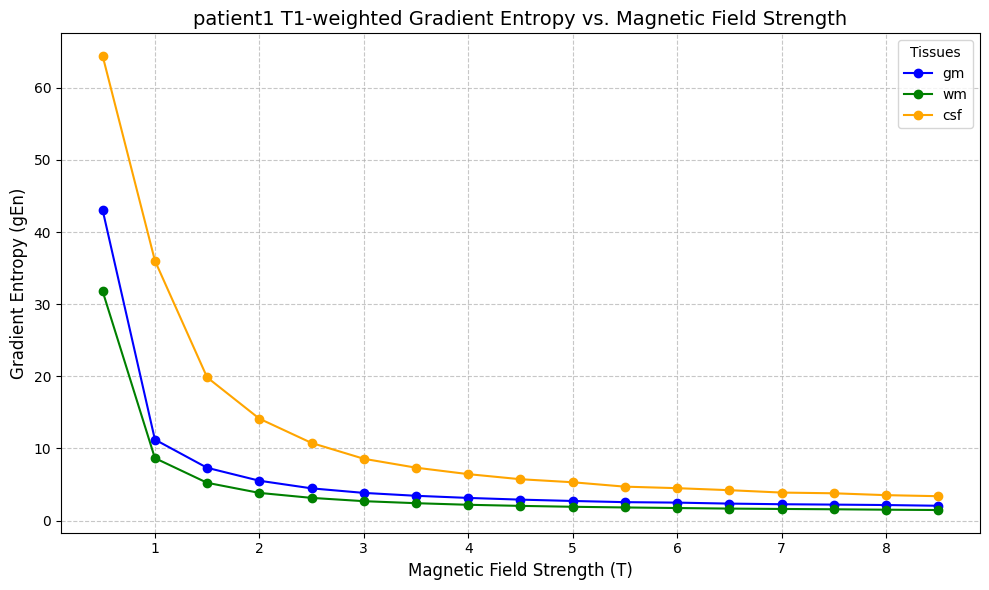

In [51]:
results = analyze_maps('patient1', 90, 'T1', noise_si_df[["SNR_T1","Noise", "SI_T1" ]], noise_si_df[["SNR_T2*","Noise", "SI_T2*" ]])
plot_gradient_entropy('patient1', 'T1', results['gradient_entropies'], ["gm", "wm", "csf"])


#### Patient - 1 T1 weighted Sharpness vs. Magnetic Field Strength for CSF to WM

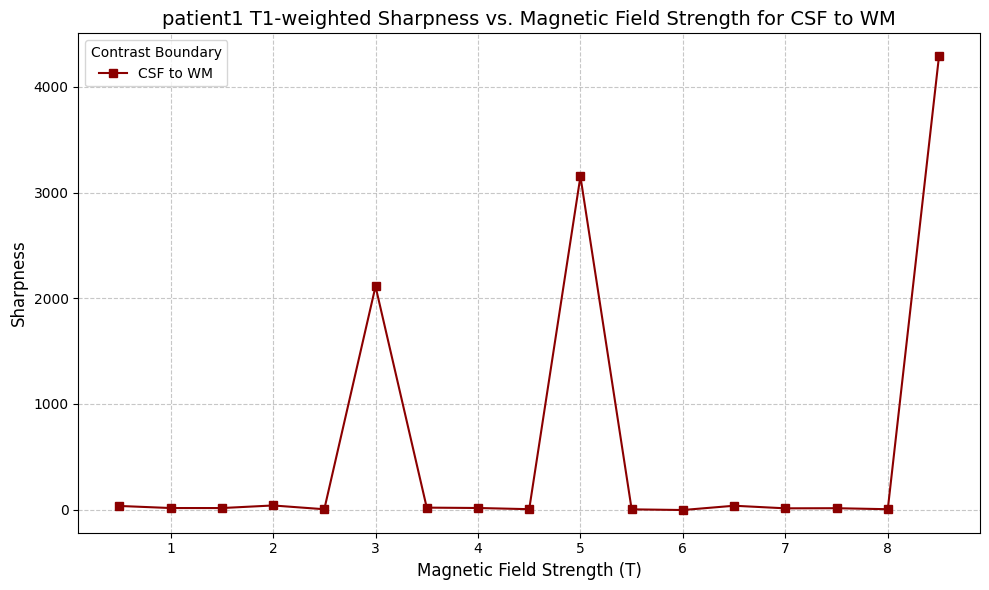

In [52]:
plot_sharpness('patient1','T1', results['sharpness_values'])

#### Patient - 1 T2* weighted Gradient Entropy vs. Magnetic Field Strength

/var/folders/2c/0yq9xjkj0hx8p523v5t2pwwr0000gn/T/ipykernel_55923/1311830426.py:48: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(sigmoid, x_data, line_profile, p0=initial_guess, maxfev=10000)


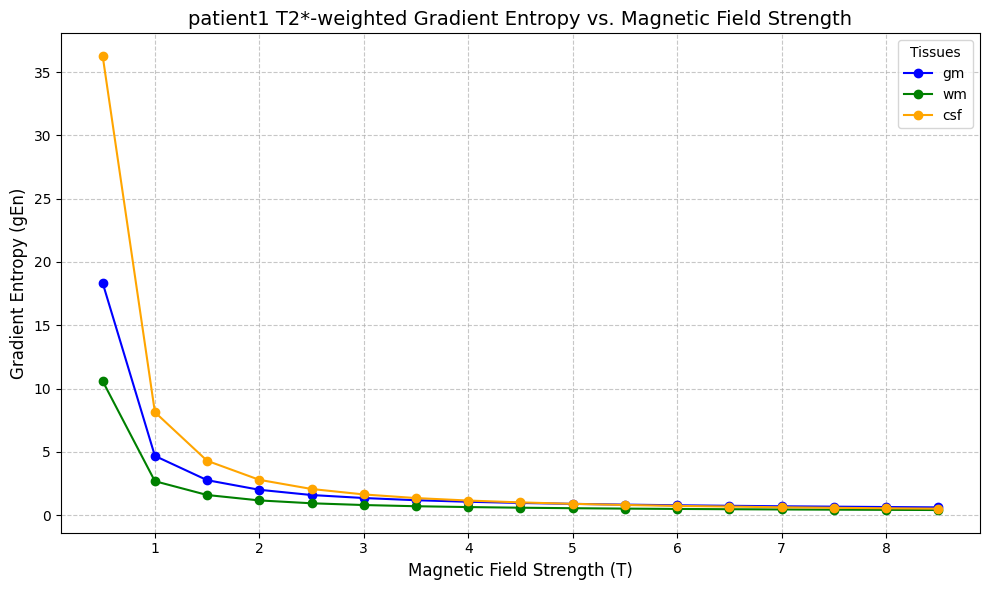

In [53]:
results = analyze_maps('patient1', 90, 'T2*', noise_si_df[["SNR_T1","Noise", "SI_T1" ]], noise_si_df[["SNR_T2*","Noise", "SI_T2*" ]])
plot_gradient_entropy('patient1', 'T2', results['gradient_entropies'], ["gm", "wm", "csf"])


#### Patient - 1 T2* weighted Sharpness vs. Magnetic Field Strength for CSF to WM

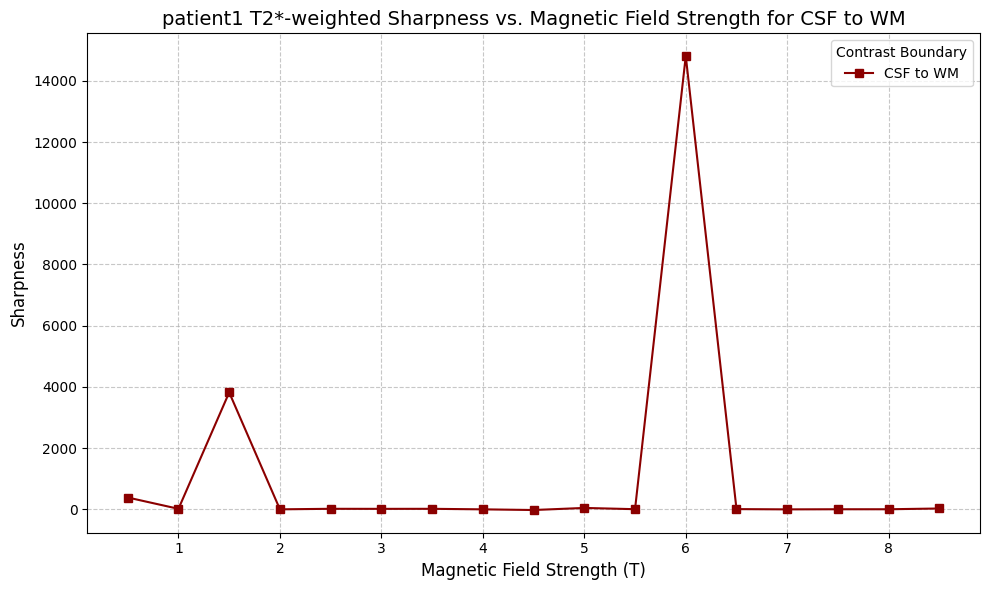

In [54]:
plot_sharpness('patient1','T2*', results['sharpness_values'])

#### Patient - 2 T1 weighted Gradient Entropy vs. Magnetic Field Strength

/var/folders/2c/0yq9xjkj0hx8p523v5t2pwwr0000gn/T/ipykernel_55923/1311830426.py:48: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(sigmoid, x_data, line_profile, p0=initial_guess, maxfev=10000)


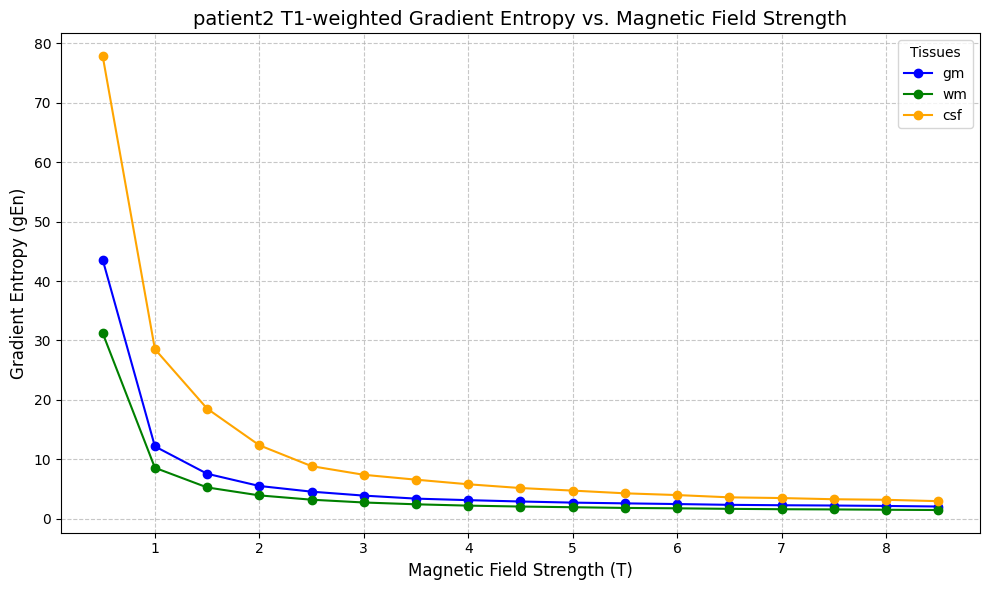

In [55]:
results = analyze_maps('patient2', 90, 'T1', noise_si_df[["SNR_T1","Noise", "SI_T1" ]], noise_si_df[["SNR_T2*","Noise", "SI_T2*" ]])
plot_gradient_entropy('patient2', 'T1', results['gradient_entropies'], ["gm", "wm", "csf"])


#### Patient - 2 T1 weighted Sharpness vs. Magnetic Field Strength for CSF to WM

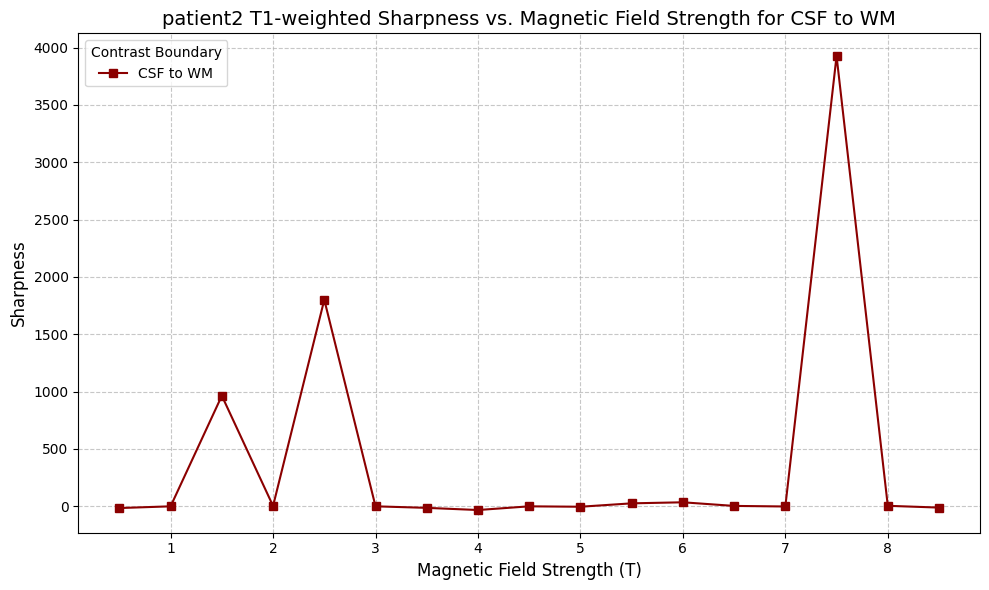

In [56]:
plot_sharpness('patient2','T1', results['sharpness_values'])

#### Patient - 2 T2* weighted Gradient Entropy vs. Magnetic Field Strength

/var/folders/2c/0yq9xjkj0hx8p523v5t2pwwr0000gn/T/ipykernel_55923/1311830426.py:48: OptimizeWarning: Covariance of the parameters could not be estimated
  popt, _ = curve_fit(sigmoid, x_data, line_profile, p0=initial_guess, maxfev=10000)


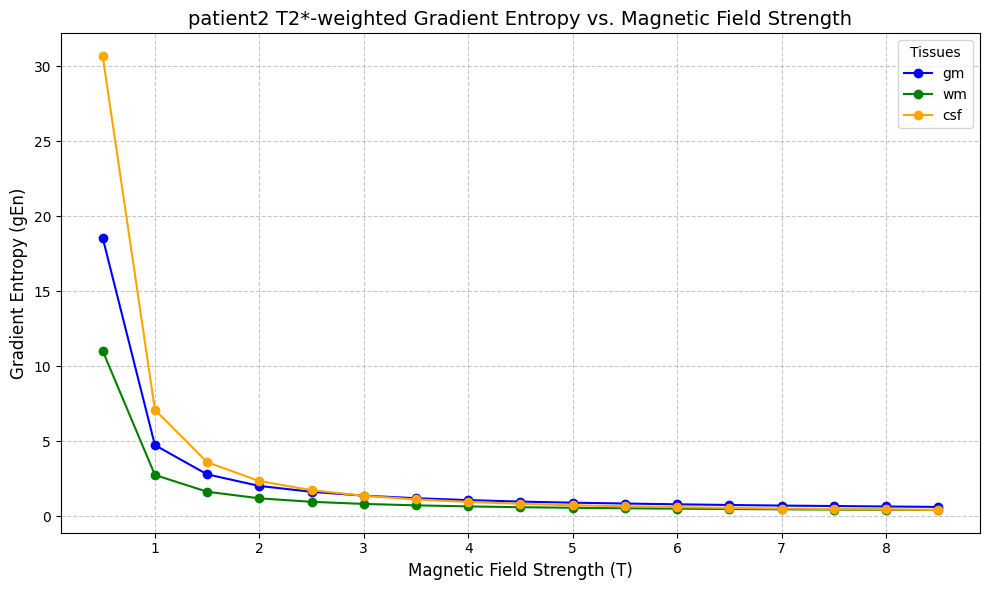

In [57]:
results = analyze_maps('patient2', 90, 'T2*', noise_si_df[["SNR_T1","Noise", "SI_T1" ]], noise_si_df[["SNR_T2*","Noise", "SI_T2*" ]])
plot_gradient_entropy('patient2', 'T2', results['gradient_entropies'], ["gm", "wm", "csf"])


#### Patient - 2 T2* weighted Sharpness vs. Magnetic Field Strength for CSF to WM

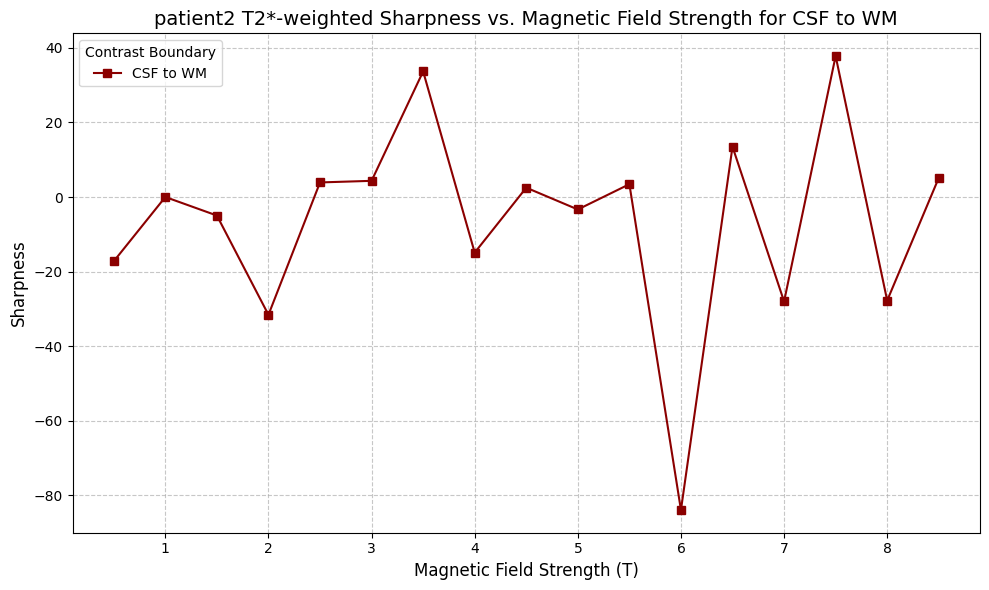

In [58]:
plot_sharpness('patient2','T2*', results['sharpness_values'])